In [83]:
import pandas as pd
import csv
import numpy as np
import datetime
import matplotlib.pyplot as plt
from google.colab import files

The time periods are explained as below

1. Early AM -- Before 6 AM
2. Peak AM -- 6 AM to 12 PM
3. Mid day -- 12 PM to 2 PM
4. Peak PM -- 2 PM to 8 PM
5. Late PM -- After 8 PM

## 1. Worcester Line

In [48]:
dfWorcester = pd.read_csv("CR-Worcester.csv")
dfSummary = pd.read_csv("New_schedule_summary.csv")
dfWorcester.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2019-10-27,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester
1,2019-11-03,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester
2,2019-11-10,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester
3,2019-11-17,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester
4,2019-11-24,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester


In [49]:
def adjust_and_convert_time(t):
    if t.startswith('24:'):
        t = '00' + t[2:]  # Replace '24' with '00'
    return datetime.datetime.strptime(t, '%H:%M:%S').time()

def categorize_time_of_day(time):
    if time < datetime.time(6, 0):
        return 'Early_AM'
    elif time >= datetime.time(6, 0) and time < datetime.time(12, 0):
        return 'Peak_AM'
    elif time >= datetime.time(12, 0) and time < datetime.time(14, 0):
        return 'Mid_day'
    elif time >= datetime.time(14, 0) and time < datetime.time(20, 0):
        return 'Peak_PM'
    elif time >= datetime.time(20, 0) and time <= datetime.time(23, 59):
        return 'Late_PM'
    else:
        return 'Invalid'


In [50]:
dfWorcester['time'] = dfWorcester['time'].apply(adjust_and_convert_time)
dfWorcester['time'] = pd.to_datetime(dfWorcester['time'], format='%H:%M:%S').dt.time
dfWorcester['PartOfDay'] = dfWorcester['time'].apply(categorize_time_of_day)

dfWorcester.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2019-10-27,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester,Peak_AM
1,2019-11-03,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester,Peak_AM
2,2019-11-10,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester,Peak_AM
3,2019-11-17,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester,Peak_AM
4,2019-11-24,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester,Peak_AM


In [51]:
grouped_df_Worcester = dfWorcester.groupby('date')
grouped_df_Worcester.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2019-10-27,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester,Peak_AM
1,2019-11-03,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester,Peak_AM
2,2019-11-10,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester,Peak_AM
3,2019-11-17,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester,Peak_AM
4,2019-11-24,06:40:00,CR-Sunday-Fall-19-2501,line-Worcester,CR-Worcester,CR-Worcester-0-0,Framingham/Worcester Line,South Station - Worcester,CR-Su-Worcester-Fll-19,1,0,South Station,Worcester,Peak_AM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34873,2020-07-04,14:50:00,CR-Saturday-DivWorcesterPTC-20-1508-BackBayFra...,line-Worcester,CR-Worcester,CR-Worcester-07874425-1_Framingham_Back Bay_0,Framingham/Worcester Line,Worcester - Framingham,CR-Sa-Worcester-DivWorcesterPTC-20,4,1,Worcester,Framingham,Peak_PM
34874,2020-07-11,14:50:00,CR-Saturday-DivWorcesterPTC-20-1508-BackBayFra...,line-Worcester,CR-Worcester,CR-Worcester-07874425-1_Framingham_Back Bay_0,Framingham/Worcester Line,Worcester - Framingham,CR-Sa-Worcester-DivWorcesterPTC-20,4,1,Worcester,Framingham,Peak_PM
34875,2020-07-18,14:50:00,CR-Saturday-DivWorcesterPTC-20-1508-BackBayFra...,line-Worcester,CR-Worcester,CR-Worcester-07874425-1_Framingham_Back Bay_0,Framingham/Worcester Line,Worcester - Framingham,CR-Sa-Worcester-DivWorcesterPTC-20,4,1,Worcester,Framingham,Peak_PM
34876,2020-07-25,14:50:00,CR-Saturday-DivWorcesterPTC-20-1508-BackBayFra...,line-Worcester,CR-Worcester,CR-Worcester-07874425-1_Framingham_Back Bay_0,Framingham/Worcester Line,Worcester - Framingham,CR-Sa-Worcester-DivWorcesterPTC-20,4,1,Worcester,Framingham,Peak_PM


In [54]:
partDay = dfWorcester.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfWorcester.groupby('date')['route_id'].first()
dfWorcesterCleaned = partDay.join(route_id)
line_id = dfWorcester.groupby('date')['line_id'].first()
dfWorcesterCleaned = partDay.join(line_id)
dfWorcesterCleaned.reset_index(inplace=True)
dfWorcesterCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,7,8,3,18,18,54,line-Worcester
1,2019-10-04,7,8,3,18,18,54,line-Worcester
2,2019-10-05,0,4,2,6,6,18,line-Worcester
3,2019-10-06,0,4,2,6,6,18,line-Worcester
4,2019-10-07,7,8,3,18,18,54,line-Worcester


In [56]:
dfWorcesterCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
1029,2022-08-06,2,4,2,6,6,20,line-Worcester
1030,2022-08-07,2,4,2,6,6,20,line-Worcester
1031,2022-08-08,5,6,2,12,17,42,line-Worcester
1032,2022-08-09,5,6,2,12,17,42,line-Worcester
1033,2022-08-10,5,6,2,12,17,42,line-Worcester


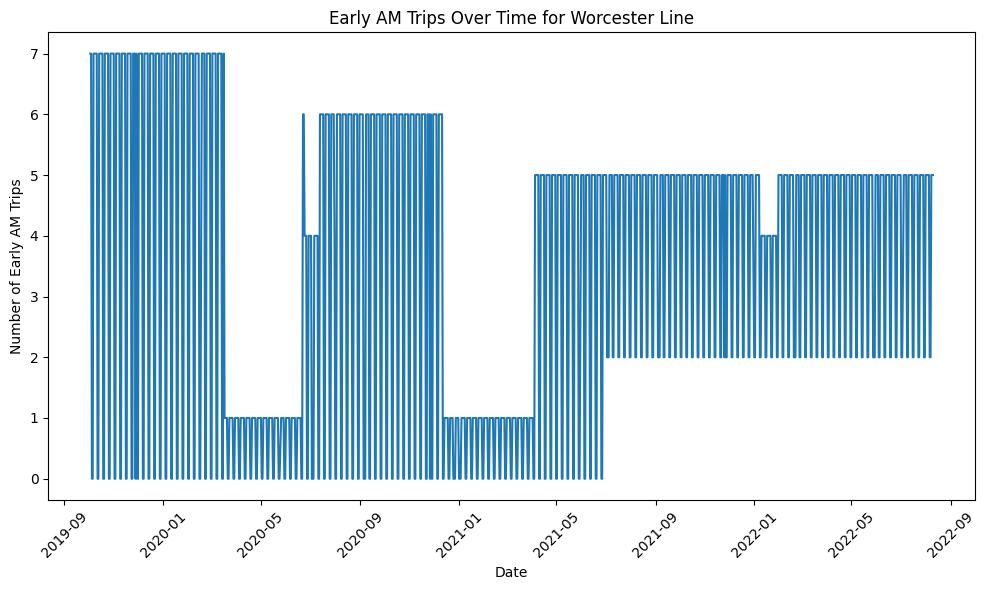

In [77]:
dfWorcesterCleaned['date'] = pd.to_datetime(dfWorcesterCleaned['date'])

dfWorcesterCleaned = dfWorcesterCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfWorcesterCleaned['date'], dfWorcesterCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Worcester Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

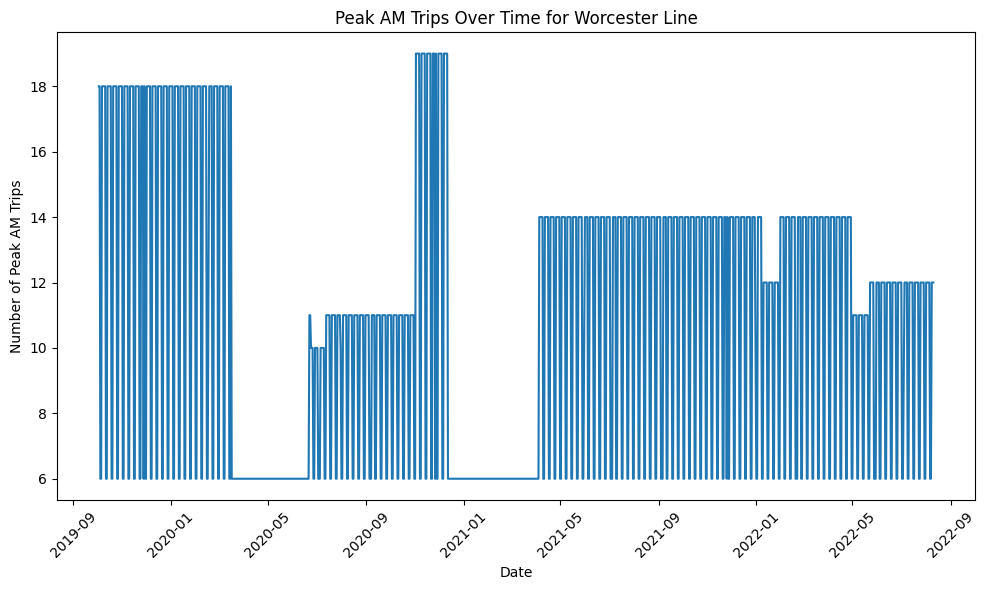

In [78]:
dfWorcesterCleaned['date'] = pd.to_datetime(dfWorcesterCleaned['date'])

dfWorcesterCleaned = dfWorcesterCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfWorcesterCleaned['date'], dfWorcesterCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Worcester Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


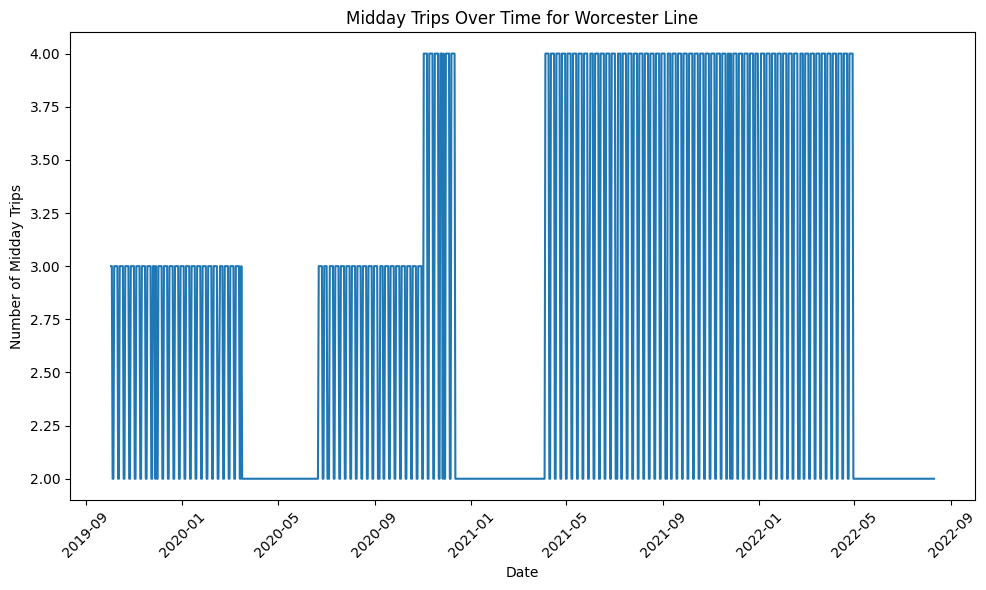

In [79]:
dfWorcesterCleaned['date'] = pd.to_datetime(dfWorcesterCleaned['date'])

dfWorcesterCleaned = dfWorcesterCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfWorcesterCleaned['date'], dfWorcesterCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Worcester Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



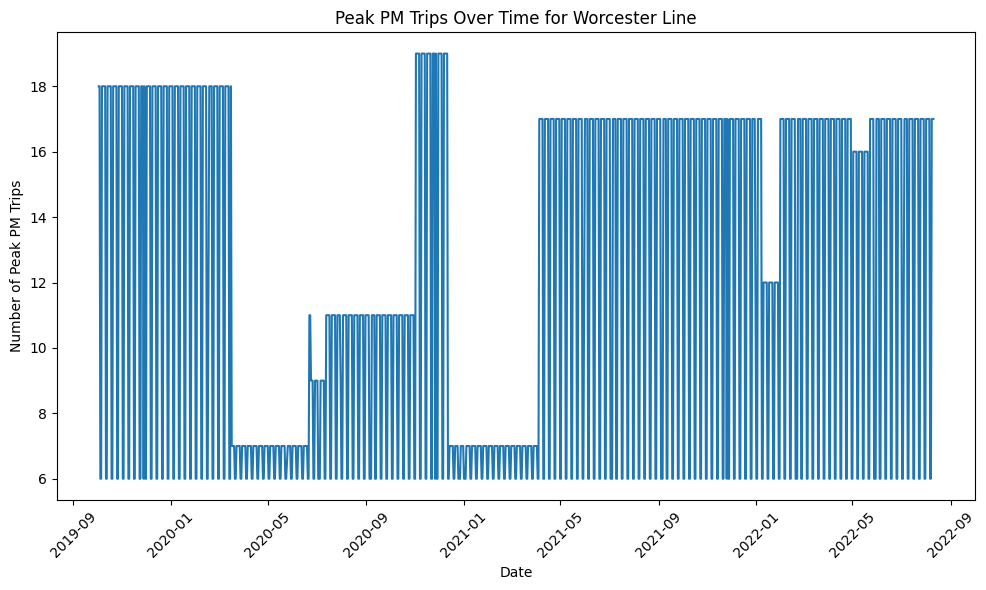

In [80]:
dfWorcesterCleaned['date'] = pd.to_datetime(dfWorcesterCleaned['date'])

dfWorcesterCleaned = dfWorcesterCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfWorcesterCleaned['date'], dfWorcesterCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Worcester Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

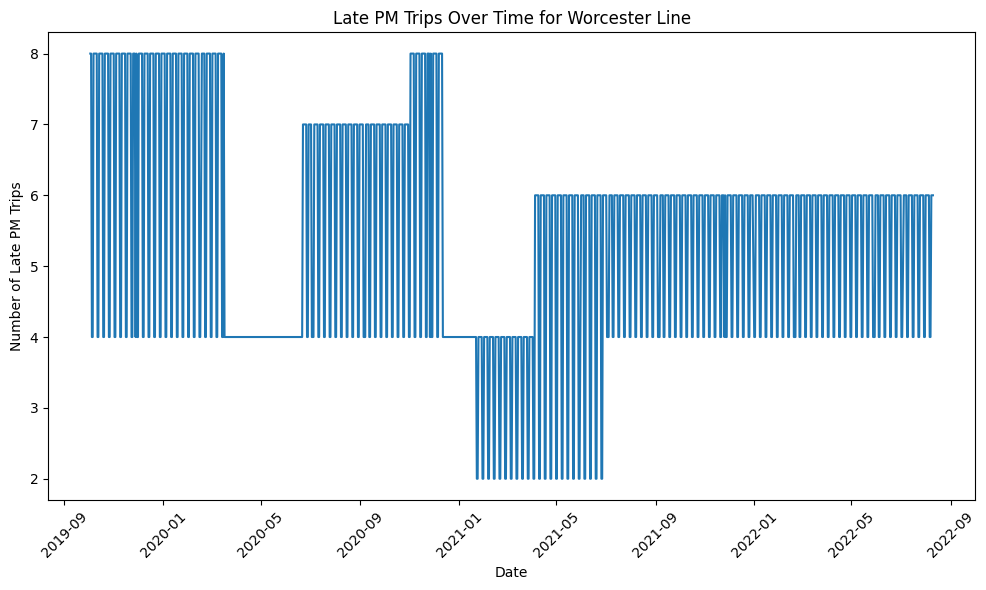

In [81]:
dfWorcesterCleaned['date'] = pd.to_datetime(dfWorcesterCleaned['date'])

dfWorcesterCleaned = dfWorcesterCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfWorcesterCleaned['date'], dfWorcesterCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Worcester Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


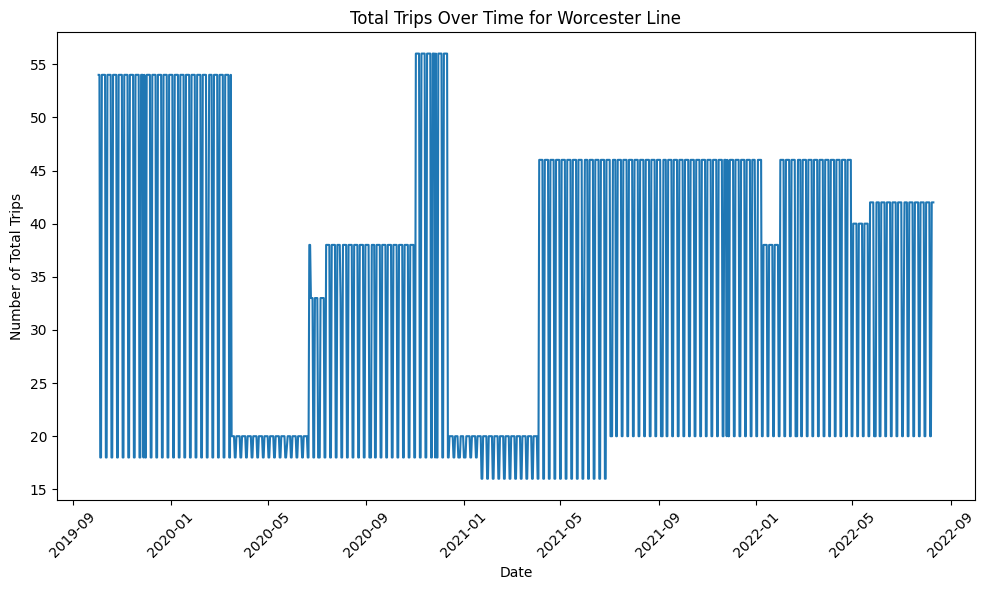

In [82]:
dfWorcesterCleaned['date'] = pd.to_datetime(dfWorcesterCleaned['date'])

dfWorcesterCleaned = dfWorcesterCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfWorcesterCleaned['date'], dfWorcesterCleaned['Total'])
plt.title('Total Trips Over Time for Worcester Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [85]:
csv_file_path = 'updated_Worcester.csv'
dfWorcesterCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 2. Providence Line

In [87]:
dfProvidence = pd.read_csv("CR-Providence.csv")
dfProvidence.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2022-07-24,05:49:00,CR-524616-2800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Su-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station
1,2022-07-31,05:49:00,CR-524616-2800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Su-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station
2,2022-07-23,05:49:00,CR-525338-1800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Sa-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station
3,2022-07-30,05:49:00,CR-525338-1800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Sa-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station
4,2021-06-14,05:25:00,CR-483226-861,line-Providence,CR-Providence,CR-Providence-c8a4ba7c-0,Providence/Stoughton Line,South Station - Stoughton,SPR21-S-Wdy-5,1,0,South Station,Stoughton


In [88]:
dfProvidence['time'] = dfProvidence['time'].apply(adjust_and_convert_time)
dfProvidence['time'] = pd.to_datetime(dfProvidence['time'], format='%H:%M:%S').dt.time
dfProvidence['PartOfDay'] = dfProvidence['time'].apply(categorize_time_of_day)

dfProvidence.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2022-07-24,05:49:00,CR-524616-2800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Su-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station,Early_AM
1,2022-07-31,05:49:00,CR-524616-2800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Su-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station,Early_AM
2,2022-07-23,05:49:00,CR-525338-1800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Sa-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station,Early_AM
3,2022-07-30,05:49:00,CR-525338-1800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Sa-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station,Early_AM
4,2021-06-14,05:25:00,CR-483226-861,line-Providence,CR-Providence,CR-Providence-c8a4ba7c-0,Providence/Stoughton Line,South Station - Stoughton,SPR21-S-Wdy-5,1,0,South Station,Stoughton,Early_AM


In [89]:
grouped_df_Providence = dfProvidence.groupby('date')
grouped_df_Providence.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2022-07-24,05:49:00,CR-524616-2800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Su-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station,Early_AM
1,2022-07-31,05:49:00,CR-524616-2800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Su-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station,Early_AM
2,2022-07-23,05:49:00,CR-525338-1800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Sa-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station,Early_AM
3,2022-07-30,05:49:00,CR-525338-1800-AttleboroProvidenceExpress2,line-Providence,CR-Providence,CR-Providence-af596fdf-1_NEC-1851_NEC-1969_2,Providence/Stoughton Line,Attleboro - South Station,SPR22-S-Sa-1-Scbbf1ea5-AtrPrcExs,4,1,Attleboro,South Station,Early_AM
4,2021-06-14,05:25:00,CR-483226-861,line-Providence,CR-Providence,CR-Providence-c8a4ba7c-0,Providence/Stoughton Line,South Station - Stoughton,SPR21-S-Wdy-5,1,0,South Station,Stoughton,Early_AM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41480,2020-03-14,14:20:00,CR-Saturday-FallProvB-19-1809,line-Providence,CR-Providence,CR-Providence-0-0,Providence/Stoughton Line,South Station - Wickford Junction,CR-Sa-Providence-FllProvB-19,1,0,South Station,Providence,Peak_PM
41481,2020-03-21,14:20:00,CR-Saturday-FallProvB-19-1809,line-Providence,CR-Providence,CR-Providence-0-0,Providence/Stoughton Line,South Station - Wickford Junction,CR-Sa-Providence-FllProvB-19,1,0,South Station,Providence,Peak_PM
41482,2020-03-28,14:20:00,CR-Saturday-FallProvB-19-1809,line-Providence,CR-Providence,CR-Providence-0-0,Providence/Stoughton Line,South Station - Wickford Junction,CR-Sa-Providence-FllProvB-19,1,0,South Station,Providence,Peak_PM
41483,2020-04-04,14:20:00,CR-Saturday-FallProvB-19-1809,line-Providence,CR-Providence,CR-Providence-0-0,Providence/Stoughton Line,South Station - Wickford Junction,CR-Sa-Providence-FllProvB-19,1,0,South Station,Providence,Peak_PM


In [90]:
partDay = dfProvidence.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfProvidence.groupby('date')['route_id'].first()
dfProvidenceCleaned = partDay.join(route_id)
line_id = dfProvidence.groupby('date')['line_id'].first()
dfProvidenceCleaned = partDay.join(line_id)
dfProvidenceCleaned.reset_index(inplace=True)
dfProvidenceCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,3,9,2,15,21,50,line-Providence
1,2019-10-04,3,9,2,15,21,50,line-Providence
2,2019-10-05,0,2,1,3,3,9,line-Providence
3,2019-10-06,0,2,1,1,3,7,line-Providence
4,2019-10-07,3,9,2,15,21,50,line-Providence


In [91]:
dfProvidenceCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
1028,2022-08-06,1,3,2,6,6,18,line-Providence
1029,2022-08-07,1,3,2,6,6,18,line-Providence
1030,2022-08-08,4,8,6,21,23,62,line-Providence
1031,2022-08-09,4,8,6,21,23,62,line-Providence
1032,2022-08-10,4,8,6,21,23,62,line-Providence


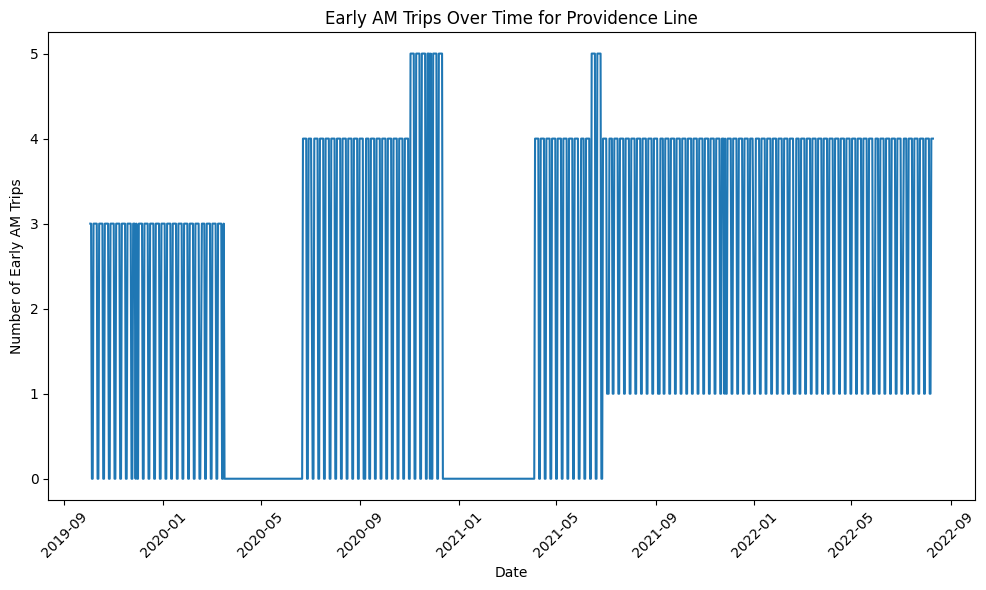

In [92]:
dfProvidenceCleaned['date'] = pd.to_datetime(dfProvidenceCleaned['date'])

dfProvidenceCleaned = dfProvidenceCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfProvidenceCleaned['date'], dfProvidenceCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Providence Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

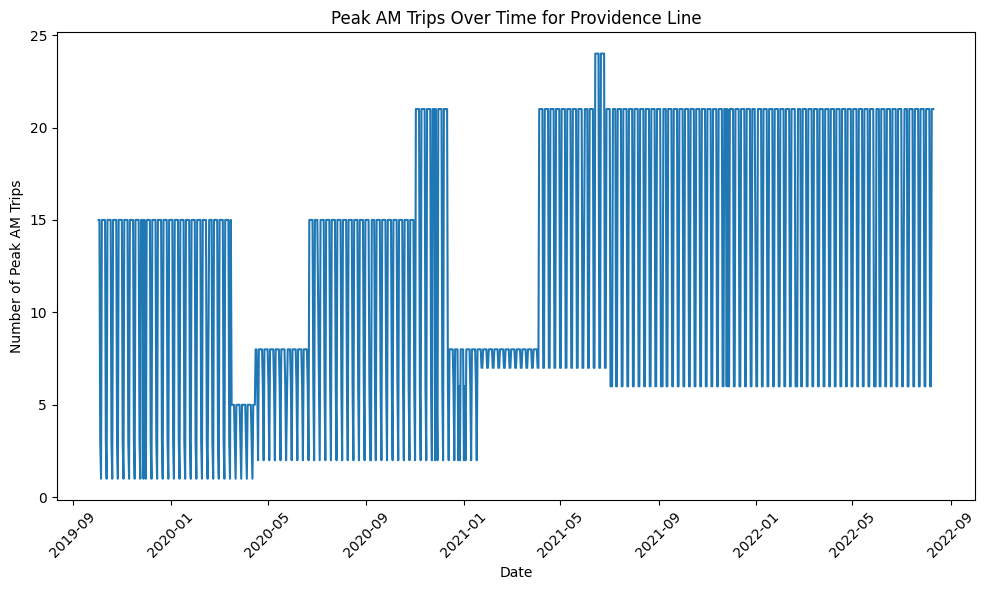

In [93]:
dfProvidenceCleaned['date'] = pd.to_datetime(dfProvidenceCleaned['date'])

dfProvidenceCleaned = dfProvidenceCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfProvidenceCleaned['date'], dfProvidenceCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Providence Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


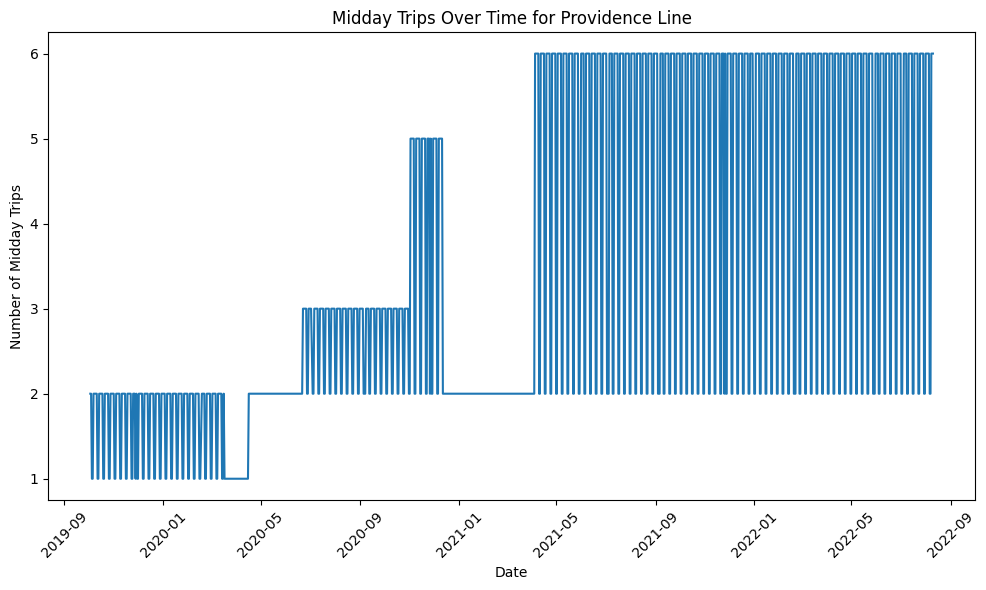

In [94]:
dfProvidenceCleaned['date'] = pd.to_datetime(dfProvidenceCleaned['date'])

dfProvidenceCleaned = dfProvidenceCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfProvidenceCleaned['date'], dfProvidenceCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Providence Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



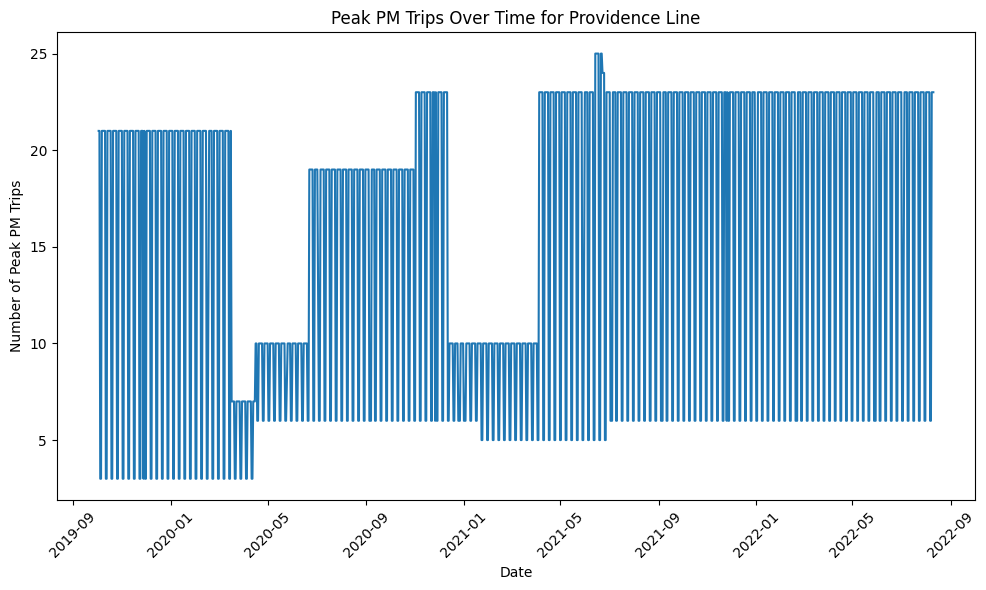

In [95]:
dfProvidenceCleaned['date'] = pd.to_datetime(dfProvidenceCleaned['date'])

dfProvidenceCleaned = dfProvidenceCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfProvidenceCleaned['date'], dfProvidenceCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Providence Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

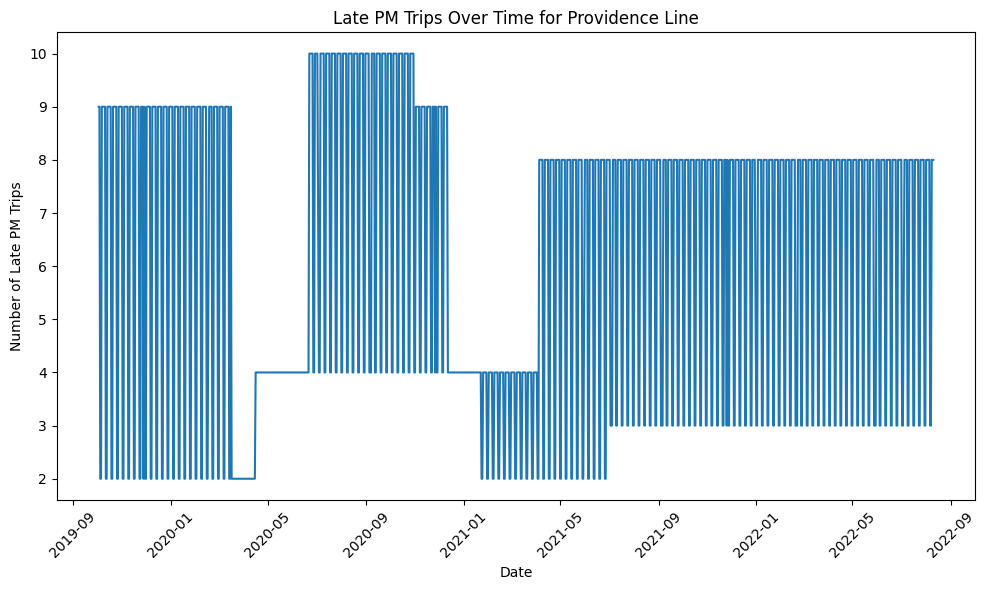

In [96]:
dfProvidenceCleaned['date'] = pd.to_datetime(dfProvidenceCleaned['date'])

dfProvidenceCleaned = dfProvidenceCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfProvidenceCleaned['date'], dfProvidenceCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Providence Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [ ]:
dfProvidenceCleaned['date'] = pd.to_datetime(dfProvidenceCleaned['date'])

dfProvidenceCleaned = dfProvidenceCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfProvidenceCleaned['date'], dfProvidenceCleaned['Total'])
plt.title('Total Trips Over Time for Providence Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [97]:
csv_file_path = 'updated_Providence.csv'
dfProvidenceCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 3. Newburyport Line

In [98]:
dfNewburyport = pd.read_csv("CR-Newburyport.csv")
dfNewburyport.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2019-11-03,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport
1,2019-11-10,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport
2,2019-11-17,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport
3,2019-11-24,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport
4,2019-11-28,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport


In [99]:
dfNewburyport['time'] = dfNewburyport['time'].apply(adjust_and_convert_time)
dfNewburyport['time'] = pd.to_datetime(dfNewburyport['time'], format='%H:%M:%S').dt.time
dfNewburyport['PartOfDay'] = dfNewburyport['time'].apply(categorize_time_of_day)

dfNewburyport.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2019-11-03,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport,Peak_AM
1,2019-11-10,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport,Peak_AM
2,2019-11-17,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport,Peak_AM
3,2019-11-24,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport,Peak_AM
4,2019-11-28,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport,Peak_AM


In [100]:
grouped_df_Newburyport = dfNewburyport.groupby('date')
grouped_df_Newburyport.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2019-11-03,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport,Peak_AM
1,2019-11-10,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport,Peak_AM
2,2019-11-17,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport,Peak_AM
3,2019-11-24,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport,Peak_AM
4,2019-11-28,09:30:00,CR-Sunday-Fall-19-2151,line-Newburyport,CR-Newburyport,CR-Newburyport-0-0,Newburyport/Rockport Line,North Station - Newburyport,CR-Su-Newburyport-Fll-19,1,0,North Station,Newburyport,Peak_AM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24739,2022-07-03,16:30:00,CR-528540-2111,line-Newburyport,CR-Newburyport,CR-Newburyport-5c4ca768-0,Newburyport/Rockport Line,North Station - Rockport,SPR22-N-Su-1-S9f,1,0,North Station,Rockport,Peak_PM
24740,2022-06-05,14:30:00,CR-528542-2109,line-Newburyport,CR-Newburyport,CR-Newburyport-5c4ca768-0,Newburyport/Rockport Line,North Station - Rockport,SPRING2022-N-Sunday-1-S9f,1,0,North Station,Rockport,Peak_PM
24741,2022-06-19,14:30:00,CR-528542-2109,line-Newburyport,CR-Newburyport,CR-Newburyport-5c4ca768-0,Newburyport/Rockport Line,North Station - Rockport,SPRING2022-N-Su-1-S9f,1,0,North Station,Rockport,Peak_PM
24742,2022-06-26,14:30:00,CR-528542-2109,line-Newburyport,CR-Newburyport,CR-Newburyport-5c4ca768-0,Newburyport/Rockport Line,North Station - Rockport,Spring/SummerSunday,1,0,North Station,Rockport,Peak_PM


In [101]:
partDay = dfNewburyport.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfNewburyport.groupby('date')['route_id'].first()
dfNewburyportCleaned = partDay.join(route_id)
line_id = dfNewburyport.groupby('date')['line_id'].first()
dfNewburyportCleaned = partDay.join(line_id)
dfNewburyportCleaned.reset_index(inplace=True)
dfNewburyportCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,6,9,6,23,23,67,line-Newburyport
1,2019-10-04,6,9,6,23,23,67,line-Newburyport
2,2019-10-05,0,5,4,8,9,26,line-Newburyport
3,2019-10-06,0,5,4,8,9,26,line-Newburyport
4,2019-10-07,6,9,6,23,23,67,line-Newburyport


In [102]:
dfNewburyportCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
1017,2022-08-06,1,3,2,6,6,18,line-Newburyport
1018,2022-08-07,1,3,2,6,6,18,line-Newburyport
1019,2022-08-08,4,6,5,16,19,50,line-Newburyport
1020,2022-08-09,4,6,5,16,19,50,line-Newburyport
1021,2022-08-10,4,6,5,16,19,50,line-Newburyport


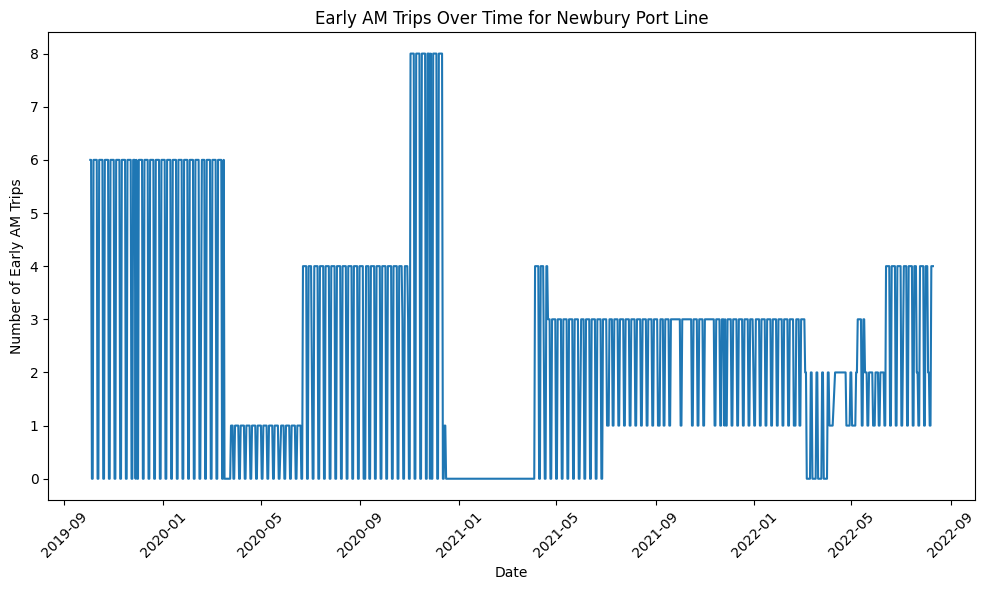

In [103]:
dfNewburyportCleaned['date'] = pd.to_datetime(dfNewburyportCleaned['date'])

dfNewburyportCleaned = dfNewburyportCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNewburyportCleaned['date'], dfNewburyportCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Newbury Port Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

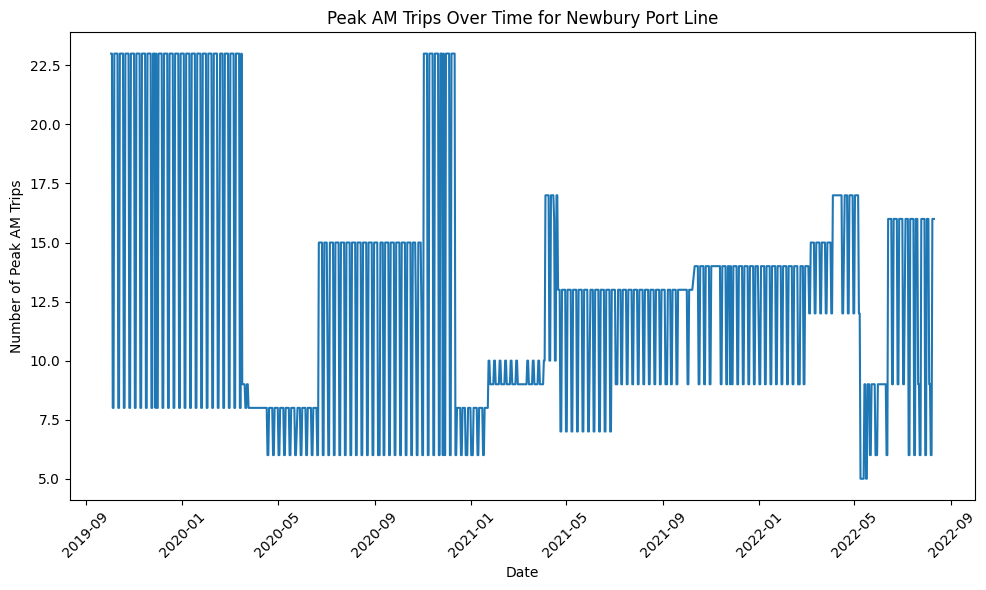

In [104]:
dfNewburyportCleaned['date'] = pd.to_datetime(dfNewburyportCleaned['date'])

dfNewburyportCleaned = dfNewburyportCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNewburyportCleaned['date'], dfNewburyportCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Newbury Port Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


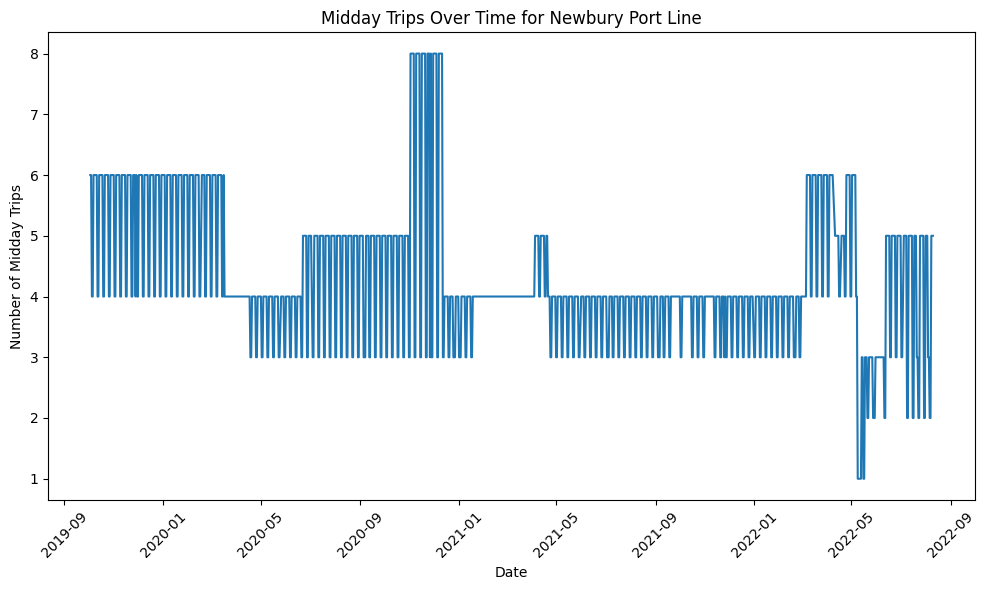

In [105]:
dfNewburyportCleaned['date'] = pd.to_datetime(dfNewburyportCleaned['date'])

dfNewburyportCleaned = dfNewburyportCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNewburyportCleaned['date'], dfNewburyportCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Newbury Port Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



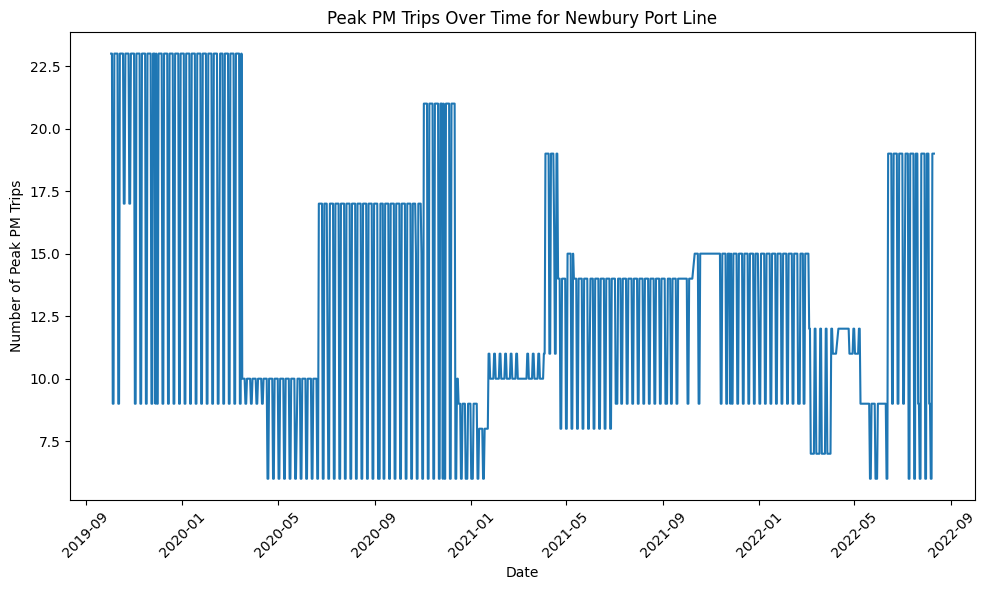

In [106]:
dfNewburyportCleaned['date'] = pd.to_datetime(dfNewburyportCleaned['date'])

dfNewburyportCleaned = dfNewburyportCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNewburyportCleaned['date'], dfNewburyportCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Newbury Port Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

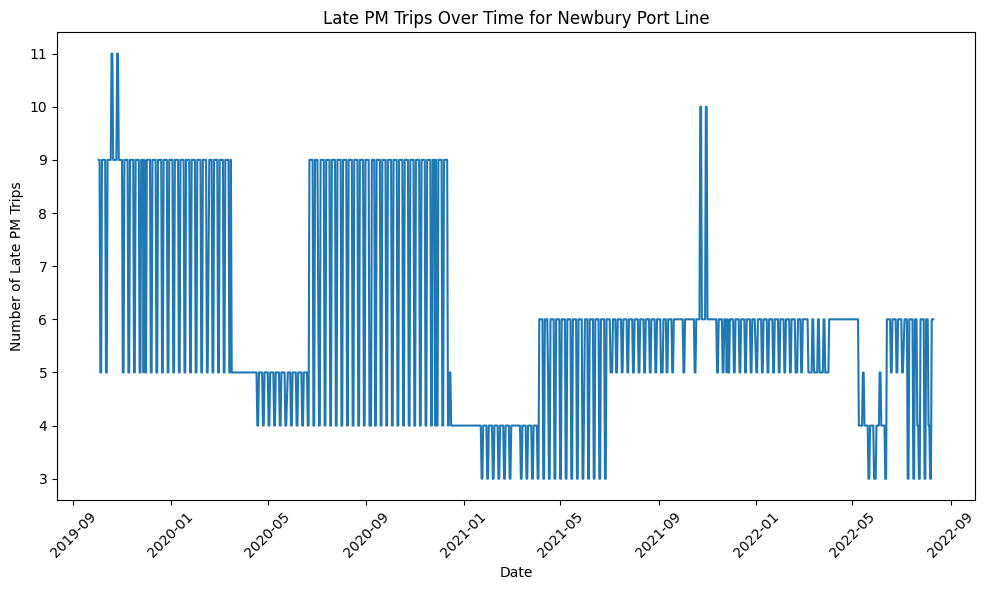

In [107]:
dfNewburyportCleaned['date'] = pd.to_datetime(dfNewburyportCleaned['date'])

dfNewburyportCleaned = dfNewburyportCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNewburyportCleaned['date'], dfNewburyportCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Newbury Port Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


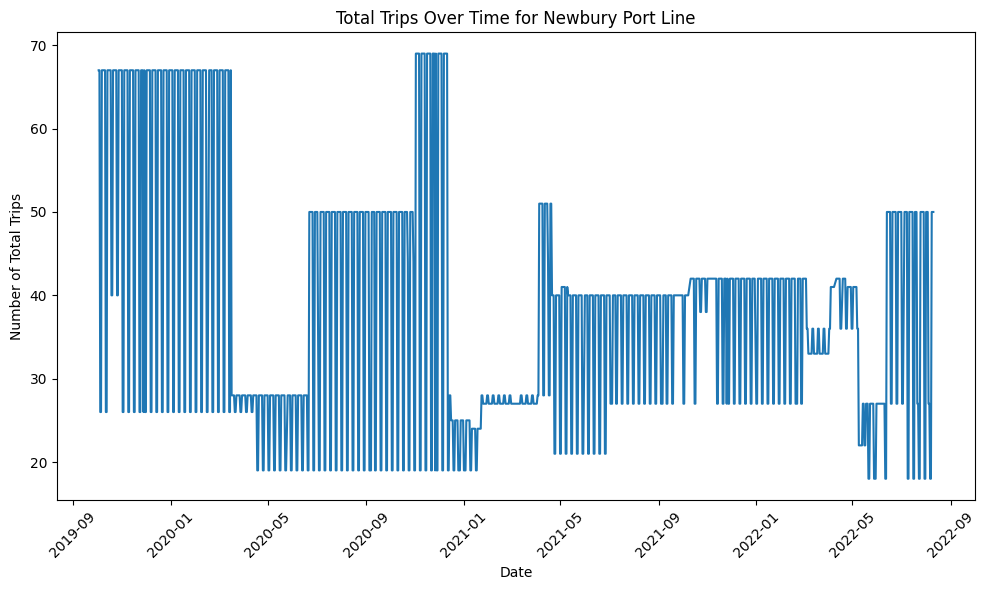

In [108]:
dfNewburyportCleaned['date'] = pd.to_datetime(dfNewburyportCleaned['date'])

dfNewburyportCleaned = dfNewburyportCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNewburyportCleaned['date'], dfNewburyportCleaned['Total'])
plt.title('Total Trips Over Time for Newbury Port Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [109]:
csv_file_path = 'updated_Newburyport.csv'
dfNewburyportCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 4. Needham Line

In [110]:
dfNeedham = pd.read_csv("CR-Needham.csv")
dfNeedham.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2021-08-21,07:15:00,CR-485349-1601-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills
1,2021-08-21,09:15:00,CR-485351-1603-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills
2,2021-08-21,11:15:00,CR-485353-1605-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills
3,2021-08-21,13:15:00,CR-485355-1607-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills
4,2021-08-21,15:15:00,CR-485357-1609-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills


In [111]:
dfNeedham['time'] = dfNeedham['time'].apply(adjust_and_convert_time)
dfNeedham['time'] = pd.to_datetime(dfNeedham['time'], format='%H:%M:%S').dt.time
dfNeedham['PartOfDay'] = dfNeedham['time'].apply(categorize_time_of_day)

dfNeedham.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-08-21,07:15:00,CR-485349-1601-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills,Peak_AM
1,2021-08-21,09:15:00,CR-485351-1603-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills,Peak_AM
2,2021-08-21,11:15:00,CR-485353-1605-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills,Peak_AM
3,2021-08-21,13:15:00,CR-485355-1607-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills,Mid_day
4,2021-08-21,15:15:00,CR-485357-1609-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills,Peak_PM


In [112]:
grouped_df_Needham = dfNeedham.groupby('date')
grouped_df_Needham.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-08-21,07:15:00,CR-485349-1601-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills,Peak_AM
1,2021-08-21,09:15:00,CR-485351-1603-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills,Peak_AM
2,2021-08-21,11:15:00,CR-485353-1605-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills,Peak_AM
3,2021-08-21,13:15:00,CR-485355-1607-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills,Mid_day
4,2021-08-21,15:15:00,CR-485357-1609-NeedhamHeightsForestHillsSouthS...,line-Needham,CR-Needham,CR-Needham-8ca06f5a-0_NEC-2237_NB-0137-S_0,Needham Line,South Station - Forest Hills,SPR21-S-Sa-6-05b623dc,4,0,South Station,Forest Hills,Peak_PM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12734,2022-07-30,14:10:00,CR-525201-1608-AttleboroProvidenceExpress,line-Needham,CR-Needham,CR-Needham-31ea698c-1,Needham Line,Needham Heights - South Station,SPR22-S-Sa-1-Scbbf1ea5-AtrPrcExs,4,1,Needham Heights,South Station,Peak_PM
12735,2022-07-23,16:10:00,CR-525203-1610-AttleboroProvidenceExpress,line-Needham,CR-Needham,CR-Needham-31ea698c-1,Needham Line,Needham Heights - South Station,SPR22-S-Sa-1-Scbbf1ea5-AtrPrcExs,4,1,Needham Heights,South Station,Peak_PM
12736,2022-07-30,16:10:00,CR-525203-1610-AttleboroProvidenceExpress,line-Needham,CR-Needham,CR-Needham-31ea698c-1,Needham Line,Needham Heights - South Station,SPR22-S-Sa-1-Scbbf1ea5-AtrPrcExs,4,1,Needham Heights,South Station,Peak_PM
12743,2021-09-12,16:10:00,CR-489988-2610-13:00-NeedhamHeightsForestHills...,line-Needham,CR-Needham,CR-Needham-31ea698c-1,Needham Line,Needham Heights - South Station,SPR21-S-Su-6-05b623dc,4,1,Needham Heights,South Station,Peak_PM


In [113]:
partDay = dfNeedham.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfNeedham.groupby('date')['route_id'].first()
dfNeedhamCleaned = partDay.join(route_id)
line_id = dfNeedham.groupby('date')['line_id'].first()
dfNeedhamCleaned = partDay.join(line_id)
dfNeedhamCleaned.reset_index(inplace=True)
dfNeedhamCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,0,5,2,12,13,32,line-Needham
1,2019-10-04,0,5,2,12,13,32,line-Needham
2,2019-10-07,0,5,2,12,13,32,line-Needham
3,2019-10-08,0,5,2,12,13,32,line-Needham
4,2019-10-09,0,5,2,12,13,32,line-Needham


In [114]:
dfNeedhamCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
908,2022-08-06,0,2,2,6,6,16,line-Needham
909,2022-08-07,0,2,2,6,6,16,line-Needham
910,2022-08-08,1,3,4,12,12,32,line-Needham
911,2022-08-09,1,3,4,12,12,32,line-Needham
912,2022-08-10,1,3,4,12,12,32,line-Needham


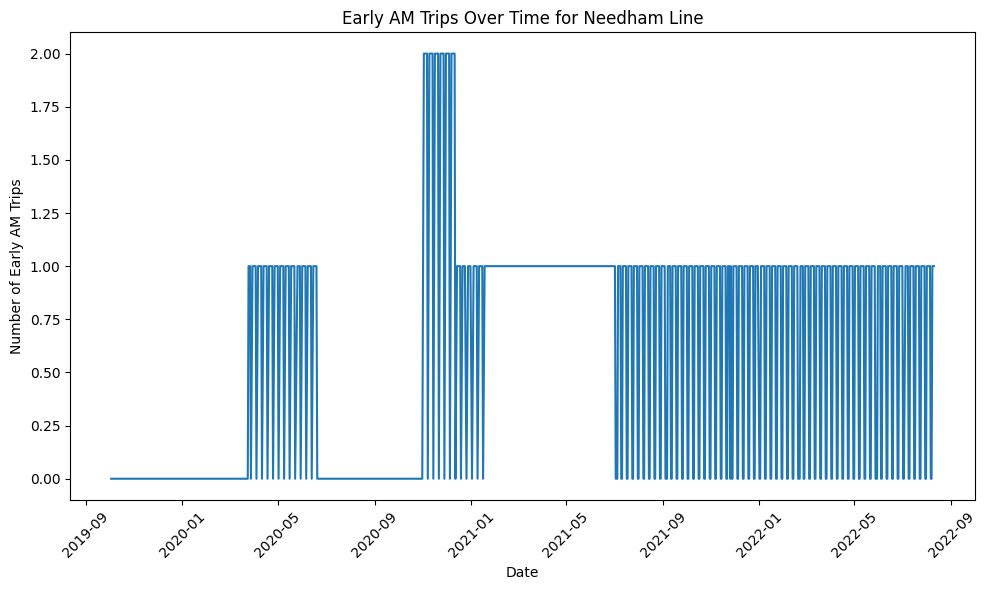

In [115]:
dfNeedhamCleaned['date'] = pd.to_datetime(dfNeedhamCleaned['date'])

dfNeedhamCleaned = dfNeedhamCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNeedhamCleaned['date'], dfNeedhamCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Needham Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
dfNeedhamCleaned['date'] = pd.to_datetime(dfNeedhamCleaned['date'])

dfNeedhamCleaned = dfNeedhamCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNeedhamCleaned['date'], dfNeedhamCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Needham Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


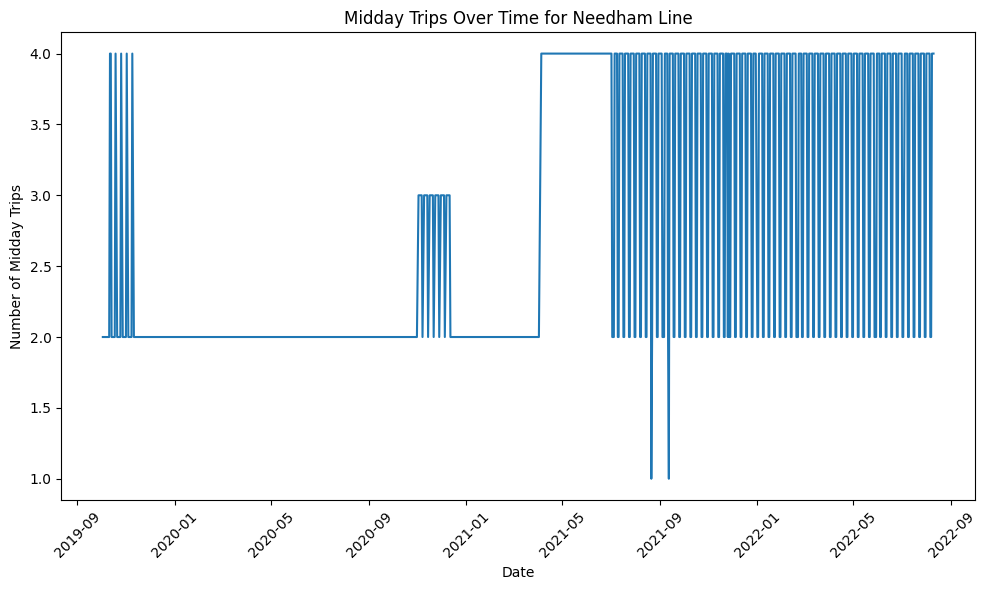

In [116]:
dfNeedhamCleaned['date'] = pd.to_datetime(dfNeedhamCleaned['date'])

dfNeedhamCleaned = dfNeedhamCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNeedhamCleaned['date'], dfNeedhamCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Needham Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



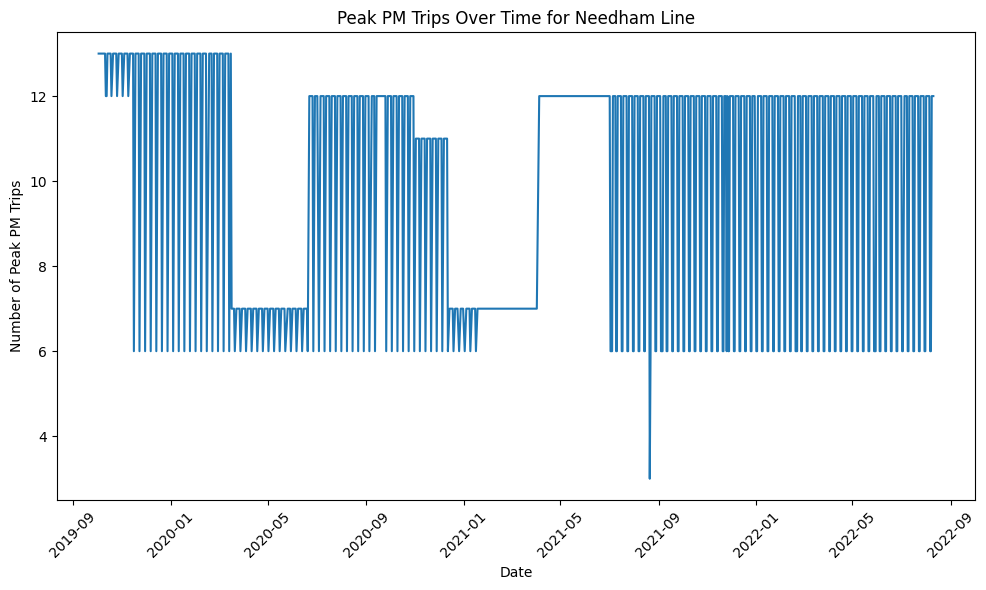

In [117]:
dfNeedhamCleaned['date'] = pd.to_datetime(dfNeedhamCleaned['date'])

dfNeedhamCleaned = dfNeedhamCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNeedhamCleaned['date'], dfNeedhamCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Needham Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

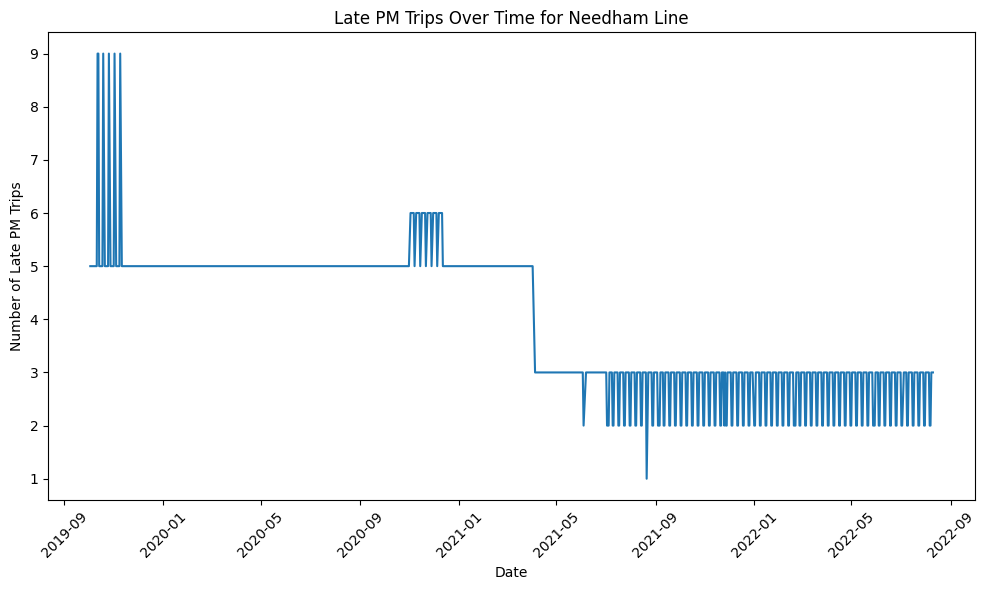

In [118]:
dfNeedhamCleaned['date'] = pd.to_datetime(dfNeedhamCleaned['date'])

dfNeedhamCleaned = dfNeedhamCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNeedhamCleaned['date'], dfNeedhamCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Needham Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


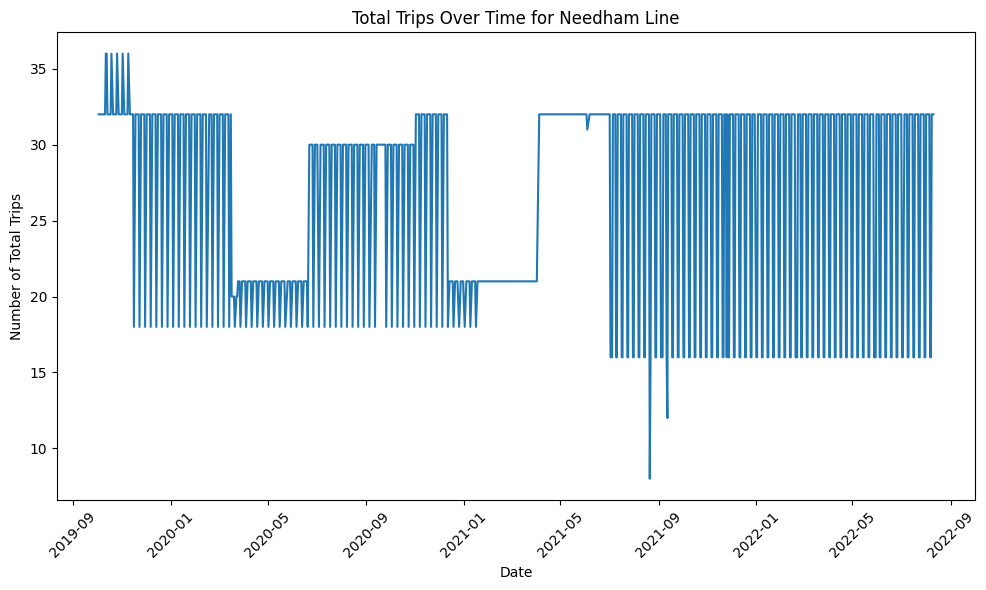

In [119]:
dfNeedhamCleaned['date'] = pd.to_datetime(dfNeedhamCleaned['date'])

dfNeedhamCleaned = dfNeedhamCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfNeedhamCleaned['date'], dfNeedhamCleaned['Total'])
plt.title('Total Trips Over Time for Needham Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [120]:
csv_file_path = 'updated_Needham.csv'
dfNeedhamCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 5. Middleborough Line

In [121]:
dfMiddleborough = pd.read_csv("CR-Middleborough.csv")
dfMiddleborough.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2019-10-27,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville
1,2019-11-03,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville
2,2019-11-10,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville
3,2019-11-17,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville
4,2019-11-24,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville


In [122]:
dfMiddleborough['time'] = dfMiddleborough['time'].apply(adjust_and_convert_time)
dfMiddleborough['time'] = pd.to_datetime(dfMiddleborough['time'], format='%H:%M:%S').dt.time
dfMiddleborough['PartOfDay'] = dfMiddleborough['time'].apply(categorize_time_of_day)

dfMiddleborough.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2019-10-27,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville,Peak_AM
1,2019-11-03,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville,Peak_AM
2,2019-11-10,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville,Peak_AM
3,2019-11-17,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville,Peak_AM
4,2019-11-24,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville,Peak_AM


In [123]:
grouped_df_Middleborough = dfMiddleborough.groupby('date')
grouped_df_Middleborough.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2019-10-27,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville,Peak_AM
1,2019-11-03,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville,Peak_AM
2,2019-11-10,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville,Peak_AM
3,2019-11-17,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville,Peak_AM
4,2019-11-24,08:40:00,CR-Sunday-Fall-19-2001,line-Middleborough,CR-Middleborough,CR-Middleborough-0-0,Middleborough/Lakeville Line,South Station - Middleborough/Lakeville,CR-Su-Middleborough-Fll-19,1,0,South Station,Middleborough/Lakeville,Peak_AM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24318,2022-05-14,06:35:00,CR-501377-1003-BridgeMiddle0,line-Middleborough,CR-Middleborough,CR-Middleborough-2507c3b4-0_MM-0277-S_MM-0356-S_0,Middleborough/Lakeville Line,South Station - Bridgewater,FALL 2021-S-Sa-1-S859962ef-BrgMdl,4,0,South Station,Bridgewater,Peak_AM
24319,2022-05-14,09:05:00,CR-501379-1005-BridgeMiddle0,line-Middleborough,CR-Middleborough,CR-Middleborough-2507c3b4-0_MM-0277-S_MM-0356-S_0,Middleborough/Lakeville Line,South Station - Bridgewater,FALL 2021-S-Sa-1-S859962ef-BrgMdl,4,0,South Station,Bridgewater,Peak_AM
24320,2022-05-14,10:35:00,CR-501381-1007-BridgeMiddle0,line-Middleborough,CR-Middleborough,CR-Middleborough-2507c3b4-0_MM-0277-S_MM-0356-S_0,Middleborough/Lakeville Line,South Station - Bridgewater,FALL 2021-S-Sa-1-S859962ef-BrgMdl,4,0,South Station,Bridgewater,Peak_AM
24321,2022-05-14,12:05:00,CR-501383-1009-BridgeMiddle0,line-Middleborough,CR-Middleborough,CR-Middleborough-2507c3b4-0_MM-0277-S_MM-0356-S_0,Middleborough/Lakeville Line,South Station - Bridgewater,FALL 2021-S-Sa-1-S859962ef-BrgMdl,4,0,South Station,Bridgewater,Mid_day


In [124]:
partDay = dfMiddleborough.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfMiddleborough.groupby('date')['route_id'].first()
dfMiddleboroughCleaned = partDay.join(route_id)
line_id = dfMiddleborough.groupby('date')['line_id'].first()
dfMiddleboroughCleaned = partDay.join(line_id)
dfMiddleboroughCleaned.reset_index(inplace=True)
dfMiddleboroughCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,1,3,1,10,9,24,line-Middleborough
1,2019-10-04,1,3,1,10,9,24,line-Middleborough
2,2019-10-05,0,3,3,5,5,16,line-Middleborough
3,2019-10-06,0,3,3,5,5,16,line-Middleborough
4,2019-10-07,1,3,1,10,9,24,line-Middleborough


In [125]:
dfMiddleboroughCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
1028,2022-08-06,1,3,4,6,6,20,line-Middleborough
1029,2022-08-07,1,3,4,6,6,20,line-Middleborough
1030,2022-08-08,3,5,4,9,9,30,line-Middleborough
1031,2022-08-09,3,5,4,9,9,30,line-Middleborough
1032,2022-08-10,3,5,4,9,9,30,line-Middleborough


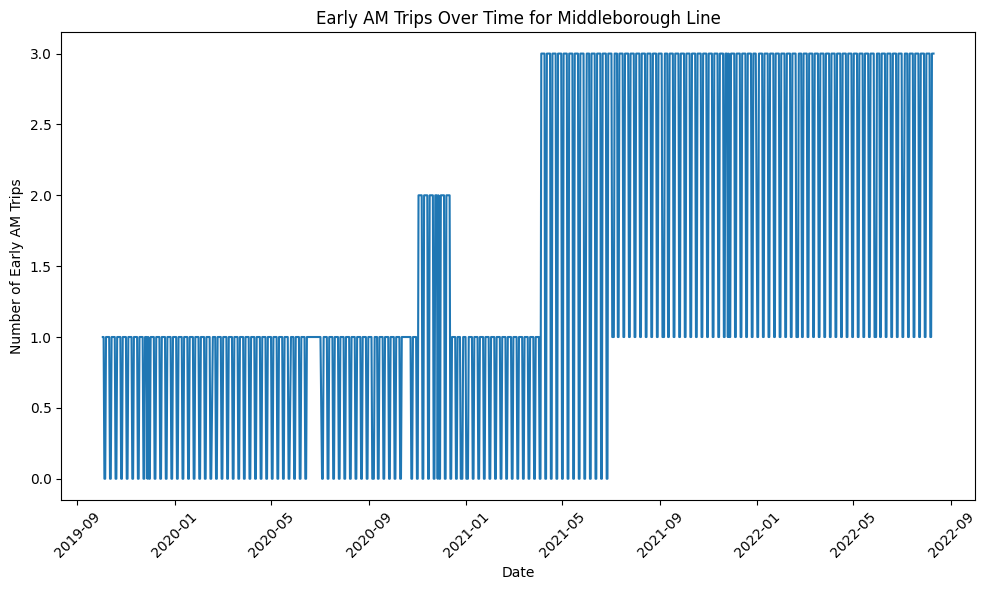

In [126]:
dfMiddleboroughCleaned['date'] = pd.to_datetime(dfMiddleboroughCleaned['date'])

dfMiddleboroughCleaned = dfMiddleboroughCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfMiddleboroughCleaned['date'], dfMiddleboroughCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Middleborough Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

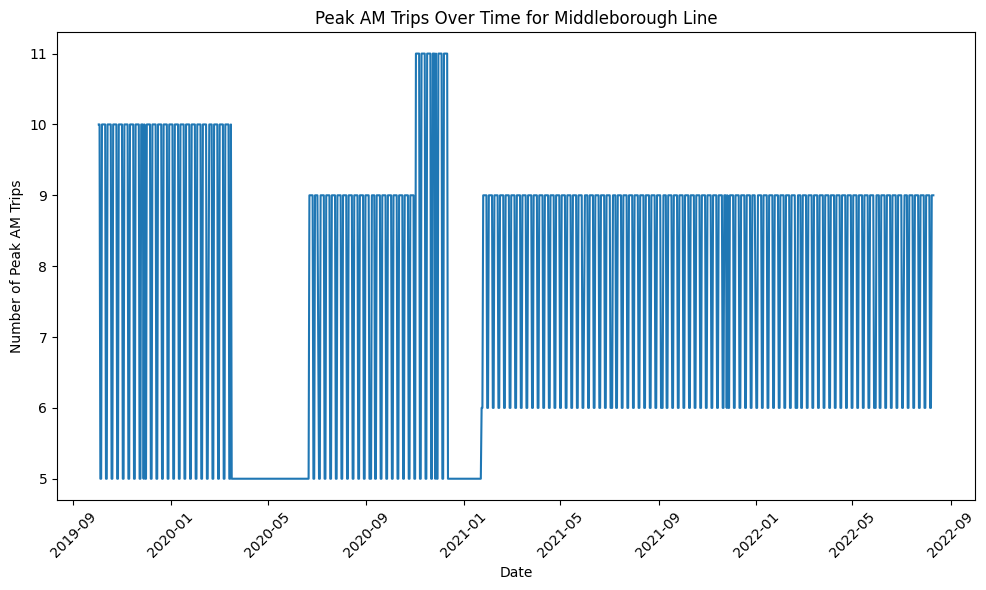

In [127]:
dfMiddleboroughCleaned['date'] = pd.to_datetime(dfMiddleboroughCleaned['date'])

dfMiddleboroughCleaned = dfMiddleboroughCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfMiddleboroughCleaned['date'], dfMiddleboroughCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Middleborough Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


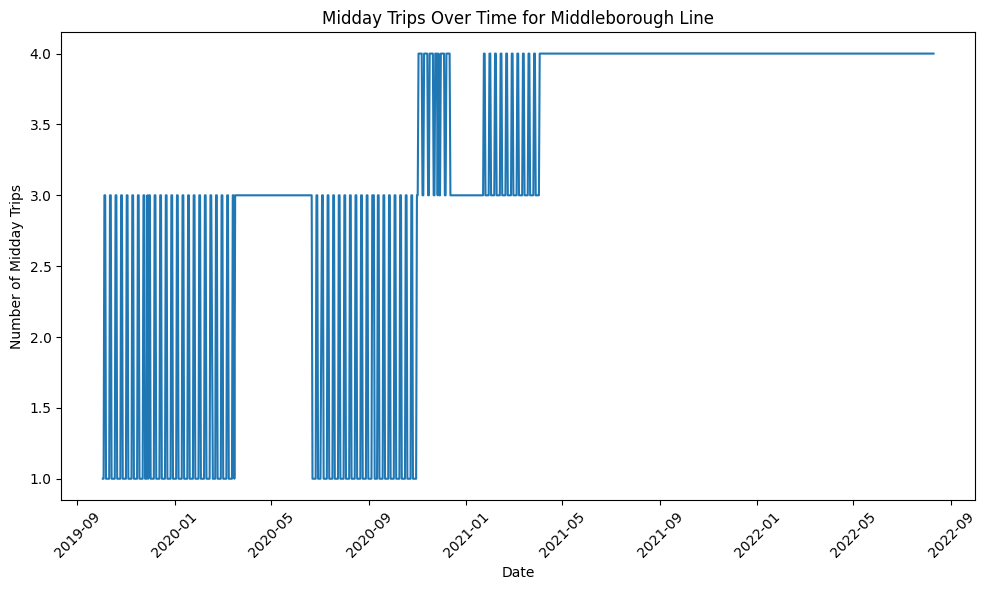

In [128]:
dfMiddleboroughCleaned['date'] = pd.to_datetime(dfMiddleboroughCleaned['date'])

dfMiddleboroughCleaned = dfMiddleboroughCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfMiddleboroughCleaned['date'], dfMiddleboroughCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Middleborough Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



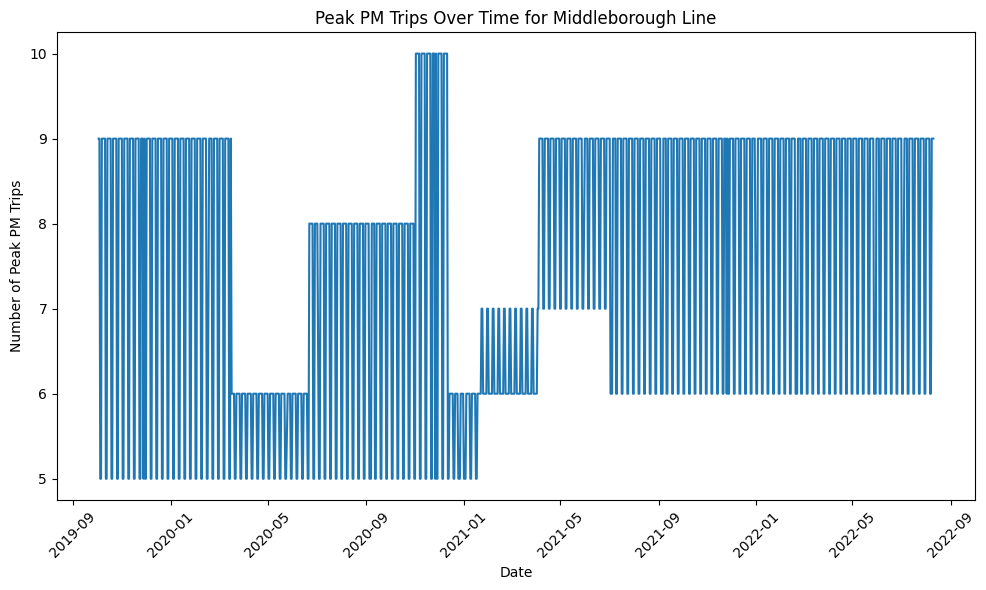

In [129]:
dfMiddleboroughCleaned['date'] = pd.to_datetime(dfMiddleboroughCleaned['date'])

dfMiddleboroughCleaned = dfMiddleboroughCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfMiddleboroughCleaned['date'], dfMiddleboroughCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Middleborough Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

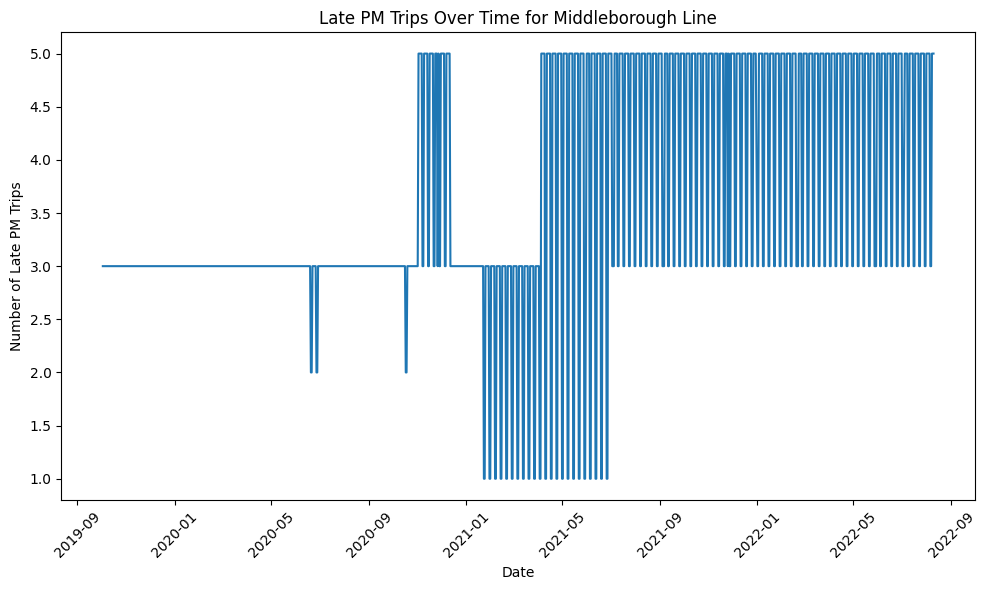

In [130]:
dfMiddleboroughCleaned['date'] = pd.to_datetime(dfMiddleboroughCleaned['date'])

dfMiddleboroughCleaned = dfMiddleboroughCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfMiddleboroughCleaned['date'], dfMiddleboroughCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Middleborough Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


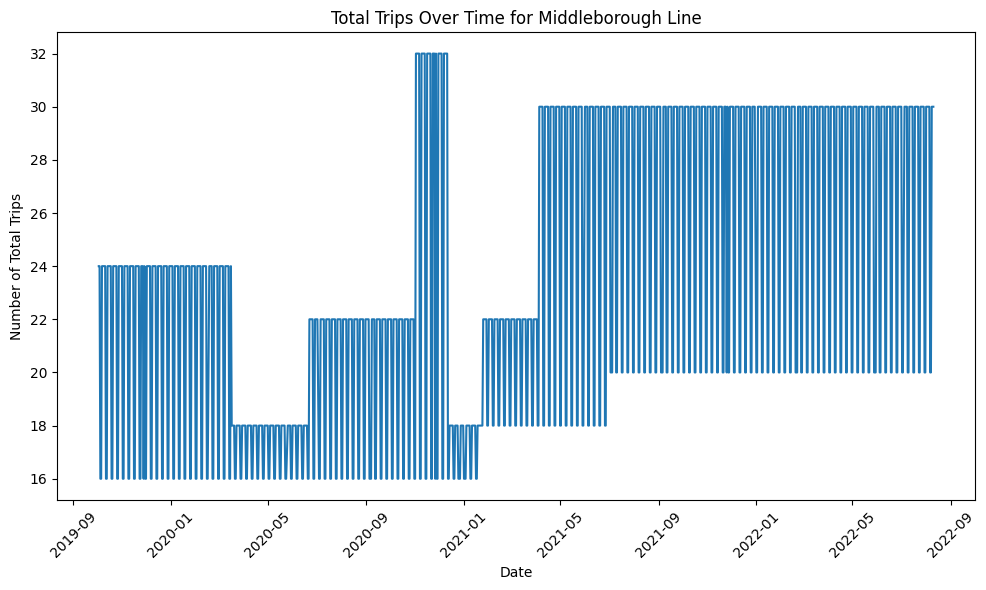

In [131]:
dfMiddleboroughCleaned['date'] = pd.to_datetime(dfMiddleboroughCleaned['date'])

dfMiddleboroughCleaned = dfMiddleboroughCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfMiddleboroughCleaned['date'], dfMiddleboroughCleaned['Total'])
plt.title('Total Trips Over Time for Middleborough Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [132]:
csv_file_path = 'updated_Middleborough.csv'
dfMiddleboroughCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 6. Lowell Line

In [133]:
dfLowell = pd.read_csv("CR-Lowell.csv")
dfLowell.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2021-06-01,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station
1,2021-06-02,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station
2,2021-06-03,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station
3,2021-06-04,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station
4,2021-06-07,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station


In [134]:
dfLowell['time'] = dfLowell['time'].apply(adjust_and_convert_time)
dfLowell['time'] = pd.to_datetime(dfLowell['time'], format='%H:%M:%S').dt.time
dfLowell['PartOfDay'] = dfLowell['time'].apply(categorize_time_of_day)

dfLowell.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-06-01,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station,Early_AM
1,2021-06-02,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station,Early_AM
2,2021-06-03,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station,Early_AM
3,2021-06-04,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station,Early_AM
4,2021-06-07,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station,Early_AM


In [135]:
grouped_df_Lowell = dfLowell.groupby('date')
grouped_df_Lowell.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-06-01,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station,Early_AM
1,2021-06-02,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station,Early_AM
2,2021-06-03,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station,Early_AM
3,2021-06-04,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station,Early_AM
4,2021-06-07,05:05:00,CR-479183-300,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1,Lowell Line,Lowell - North Station,SPR21-N-Wdy-1-S72,1,1,Lowell,North Station,Early_AM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31915,2021-05-24,08:13:00,CR-479285-308-NBL2,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1_NHRML-0254_NHRML-0218_2,Lowell Line,North Billerica - North Station,SPR21-N-Wdy-1-S7d8482ee-NBL,4,1,North Billerica,North Station,Peak_AM
31916,2021-05-25,08:13:00,CR-479285-308-NBL2,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1_NHRML-0254_NHRML-0218_2,Lowell Line,North Billerica - North Station,SPR21-N-Wdy-1-S7d8482ee-NBL,4,1,North Billerica,North Station,Peak_AM
31917,2021-05-26,08:13:00,CR-479285-308-NBL2,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1_NHRML-0254_NHRML-0218_2,Lowell Line,North Billerica - North Station,SPR21-N-Wdy-1-S7d8482ee-NBL,4,1,North Billerica,North Station,Peak_AM
31918,2021-05-27,08:13:00,CR-479285-308-NBL2,line-Lowell,CR-Lowell,CR-Lowell-89fe964c-1_NHRML-0254_NHRML-0218_2,Lowell Line,North Billerica - North Station,SPR21-N-Wdy-1-S7d8482ee-NBL,4,1,North Billerica,North Station,Peak_AM


In [136]:
partDay = dfLowell.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfLowell.groupby('date')['route_id'].first()
dfLowellCleaned = partDay.join(route_id)
line_id = dfLowell.groupby('date')['line_id'].first()
dfLowellCleaned = partDay.join(line_id)
dfLowellCleaned.reset_index(inplace=True)
dfLowellCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,3,6,4,18,19,50,line-Lowell
1,2019-10-04,3,6,4,18,19,50,line-Lowell
2,2019-10-05,0,3,2,5,6,16,line-Lowell
3,2019-10-06,0,3,2,5,6,16,line-Lowell
4,2019-10-07,3,6,4,18,19,50,line-Lowell


In [137]:
dfLowellCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
981,2022-08-06,1,3,2,6,6,18,line-Lowell
982,2022-08-07,1,3,2,6,6,18,line-Lowell
983,2022-08-08,3,7,4,14,15,43,line-Lowell
984,2022-08-09,3,7,4,14,15,43,line-Lowell
985,2022-08-10,3,7,4,14,15,43,line-Lowell


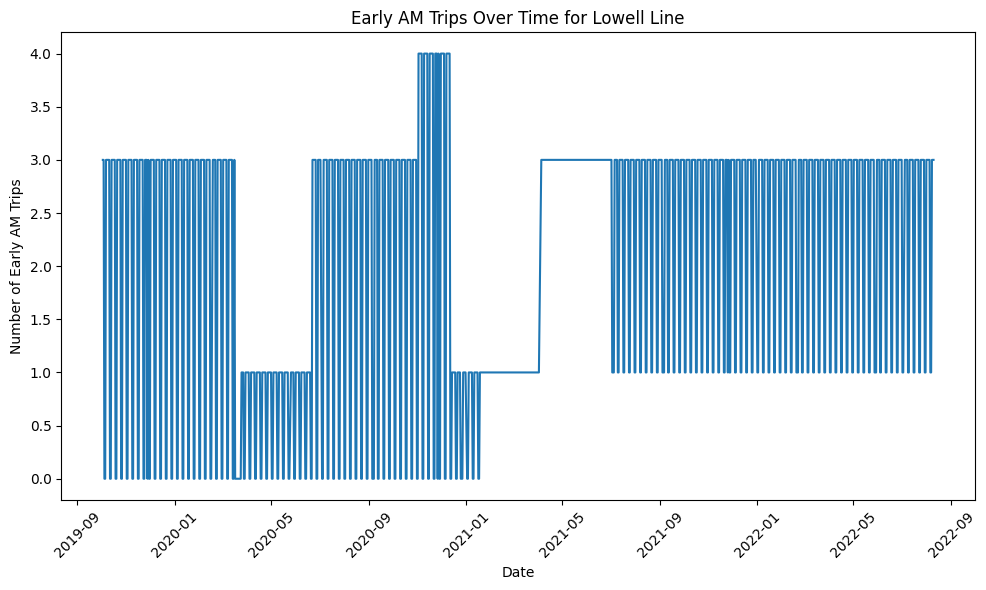

In [138]:
dfLowellCleaned['date'] = pd.to_datetime(dfLowellCleaned['date'])

dfLowellCleaned = dfLowellCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfLowellCleaned['date'], dfLowellCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Lowell Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

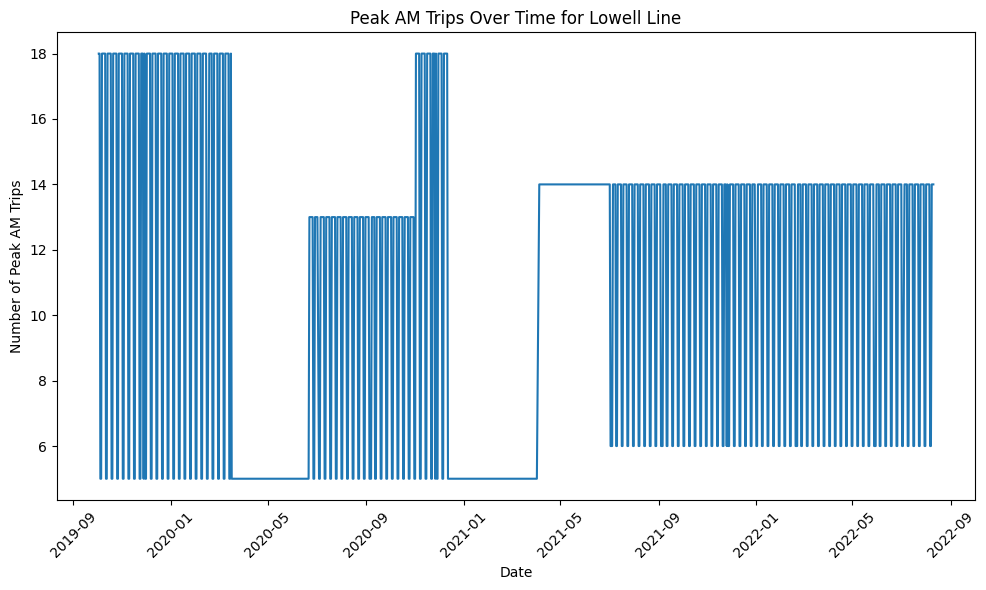

In [139]:
dfLowellCleaned['date'] = pd.to_datetime(dfLowellCleaned['date'])

dfLowellCleaned = dfLowellCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfLowellCleaned['date'], dfLowellCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Lowell Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


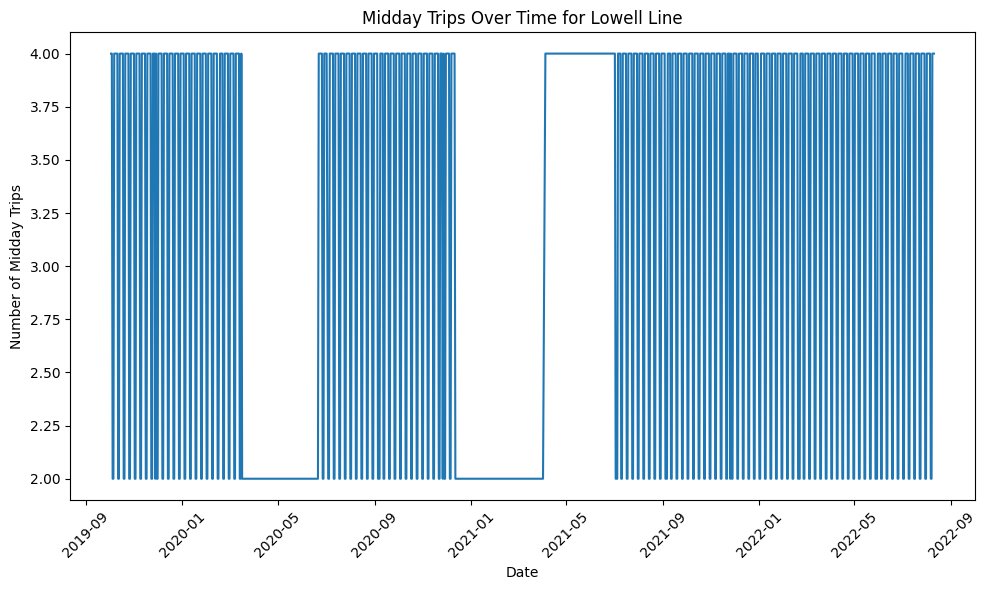

In [140]:
dfLowellCleaned['date'] = pd.to_datetime(dfLowellCleaned['date'])

dfLowellCleaned = dfLowellCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfLowellCleaned['date'], dfLowellCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Lowell Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



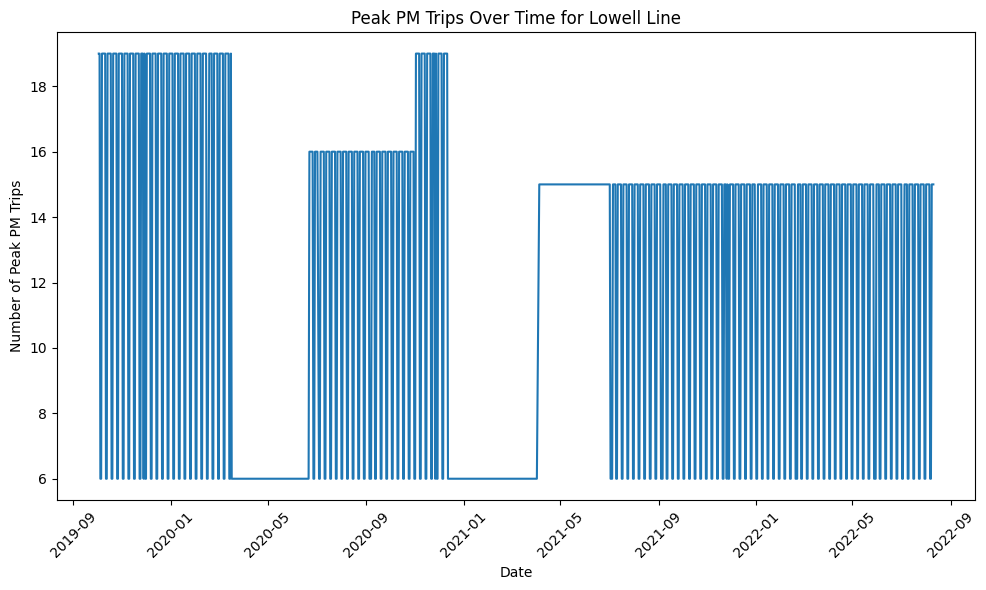

In [141]:
dfLowellCleaned['date'] = pd.to_datetime(dfLowellCleaned['date'])

dfLowellCleaned = dfLowellCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfLowellCleaned['date'], dfLowellCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Lowell Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

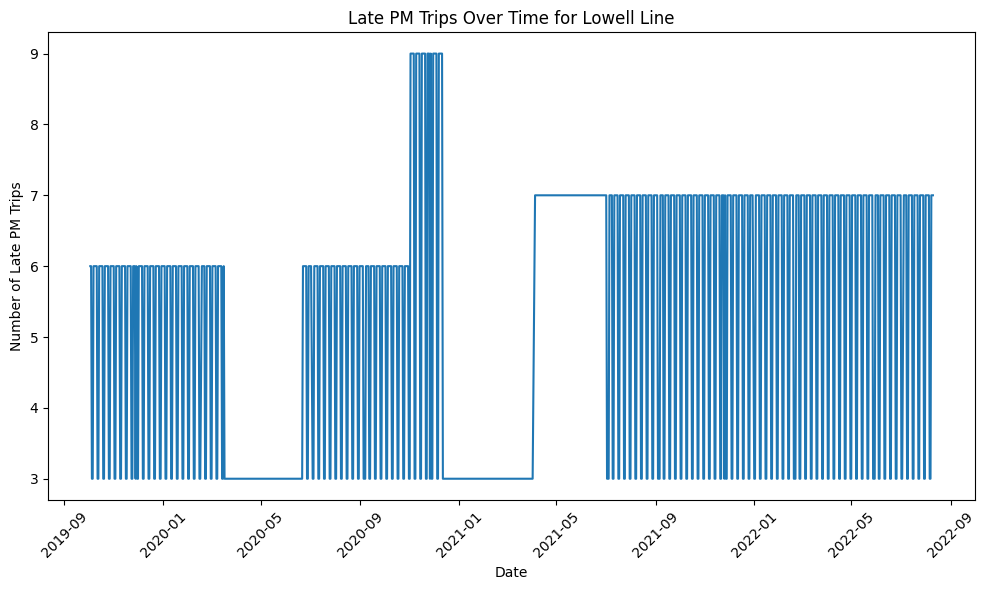

In [142]:
dfLowellCleaned['date'] = pd.to_datetime(dfLowellCleaned['date'])

dfLowellCleaned = dfLowellCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfLowellCleaned['date'], dfLowellCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Lowell Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


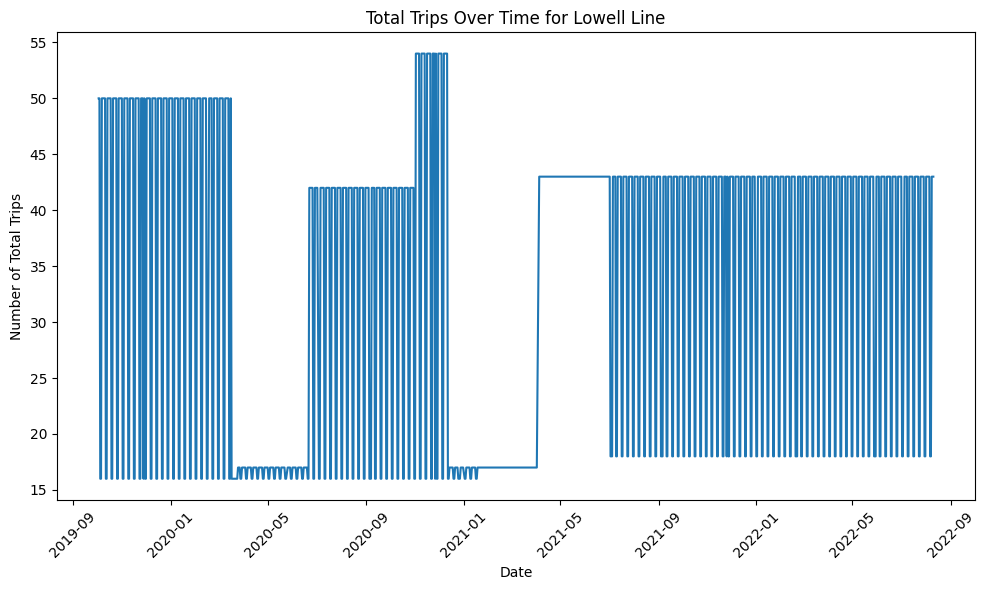

In [143]:
dfLowellCleaned['date'] = pd.to_datetime(dfLowellCleaned['date'])

dfLowellCleaned = dfLowellCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfLowellCleaned['date'], dfLowellCleaned['Total'])
plt.title('Total Trips Over Time for Lowell Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [144]:
csv_file_path = 'updated_Lowell.csv'
dfLowellCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 7. Kingston Line

In [146]:
dfKingston = pd.read_csv("CR-Kingston.csv")
dfKingston.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2021-06-14,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston
1,2021-06-15,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston
2,2021-06-16,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston
3,2021-06-17,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston
4,2021-06-18,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston


In [147]:
dfKingston['time'] = dfKingston['time'].apply(adjust_and_convert_time)
dfKingston['time'] = pd.to_datetime(dfKingston['time'], format='%H:%M:%S').dt.time
dfKingston['PartOfDay'] = dfKingston['time'].apply(categorize_time_of_day)

dfKingston.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-06-14,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston,Late_PM
1,2021-06-15,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston,Late_PM
2,2021-06-16,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston,Late_PM
3,2021-06-17,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston,Late_PM
4,2021-06-18,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston,Late_PM


In [148]:
grouped_df_Kingston = dfKingston.groupby('date')
grouped_df_Kingston.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-06-14,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston,Late_PM
1,2021-06-15,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston,Late_PM
2,2021-06-16,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston,Late_PM
3,2021-06-17,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston,Late_PM
4,2021-06-18,23:19:00,CR-483072-065,line-Kingston,CR-Kingston,CR-Kingston-a80a8fd4-0,Kingston Line,Braintree - Kingston,SPR21-S-Wdy-5,1,0,Braintree,Kingston,Late_PM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18346,2021-01-09,07:00:00,CR-Saturday-Fall-20-1032-SoWeym0,line-Kingston,CR-Kingston,CR-Kingston-97062ead-1_PB-0158-S_NEC-2287_0,Kingston/Plymouth Line,Kingston - South Weymouth,CR-Sa-Kingston-Fll-20-SWm,1,1,Kingston,South Weymouth,Peak_AM
18347,2021-01-09,08:50:00,CR-Saturday-Fall-20-1034-SoWeym0,line-Kingston,CR-Kingston,CR-Kingston-fa4e1bac-1_PB-0158-S_NEC-2287_0,Kingston/Plymouth Line,Kingston - South Weymouth,CR-Sa-Kingston-Fll-20-SWm,1,1,Kingston,South Weymouth,Peak_AM
18348,2021-01-09,11:30:00,CR-Saturday-Fall-20-1036-SoWeym0,line-Kingston,CR-Kingston,CR-Kingston-fa4e1bac-1_PB-0158-S_NEC-2287_0,Kingston/Plymouth Line,Kingston - South Weymouth,CR-Sa-Kingston-Fll-20-SWm,1,1,Kingston,South Weymouth,Peak_AM
18349,2021-01-09,15:35:00,CR-Saturday-Fall-20-1038-SoWeym0,line-Kingston,CR-Kingston,CR-Kingston-fa4e1bac-1_PB-0158-S_NEC-2287_0,Kingston/Plymouth Line,Kingston - South Weymouth,CR-Sa-Kingston-Fll-20-SWm,1,1,Kingston,South Weymouth,Peak_PM


In [149]:
partDay = dfKingston.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfKingston.groupby('date')['route_id'].first()
dfKingstonCleaned = partDay.join(route_id)
line_id = dfKingston.groupby('date')['line_id'].first()
dfKingstonCleaned = partDay.join(line_id)
dfKingstonCleaned.reset_index(inplace=True)
dfKingstonCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,1,3,3,8,9,24,line-Kingston
1,2019-10-04,1,3,3,8,9,24,line-Kingston
2,2019-10-05,0,3,1,7,5,16,line-Kingston
3,2019-10-06,0,3,1,7,5,16,line-Kingston
4,2019-10-07,1,3,3,8,9,24,line-Kingston


In [150]:
dfKingstonCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
982,2022-08-06,1,4,2,6,5,18,line-Kingston
983,2022-08-07,1,4,2,6,5,18,line-Kingston
984,2022-08-08,1,4,4,9,8,26,line-Kingston
985,2022-08-09,1,4,4,9,8,26,line-Kingston
986,2022-08-10,1,4,4,9,8,26,line-Kingston


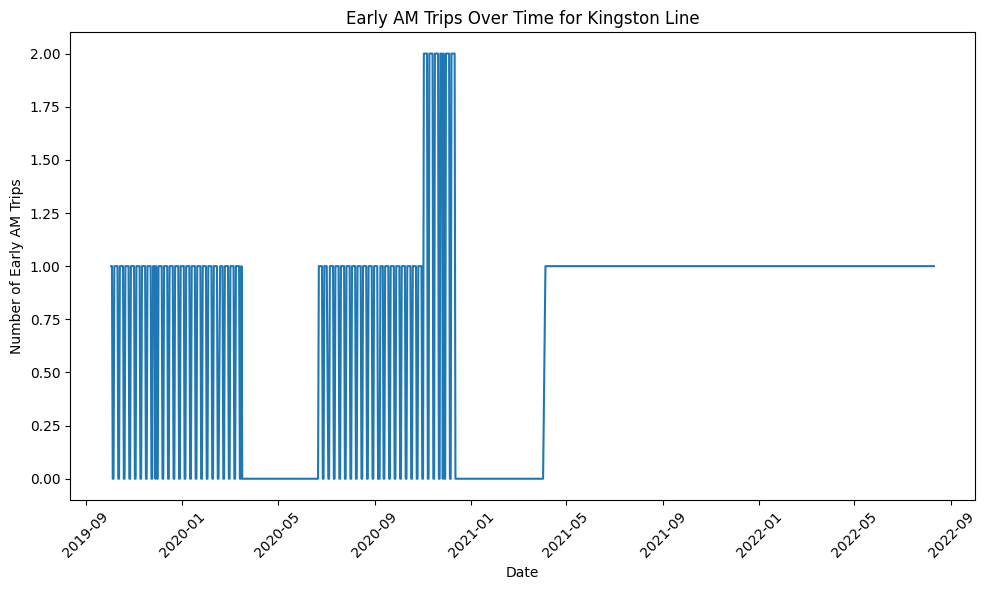

In [152]:
dfKingstonCleaned['date'] = pd.to_datetime(dfKingstonCleaned['date'])

dfKingstonCleaned = dfKingstonCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfKingstonCleaned['date'], dfKingstonCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Kingston Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

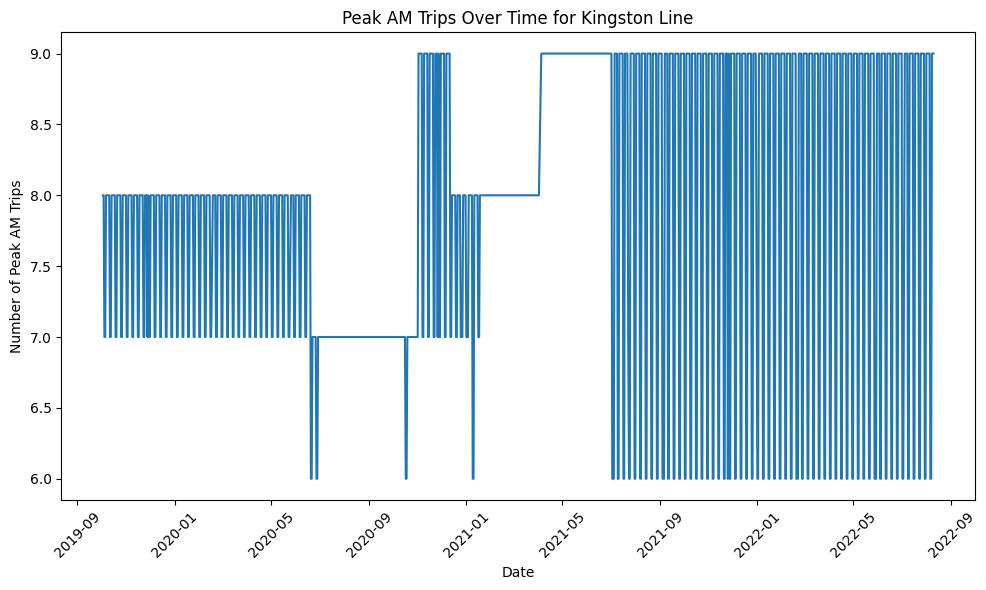

In [151]:
dfKingstonCleaned['date'] = pd.to_datetime(dfKingstonCleaned['date'])

dfKingstonCleaned = dfKingstonCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfKingstonCleaned['date'], dfKingstonCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Kingston Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


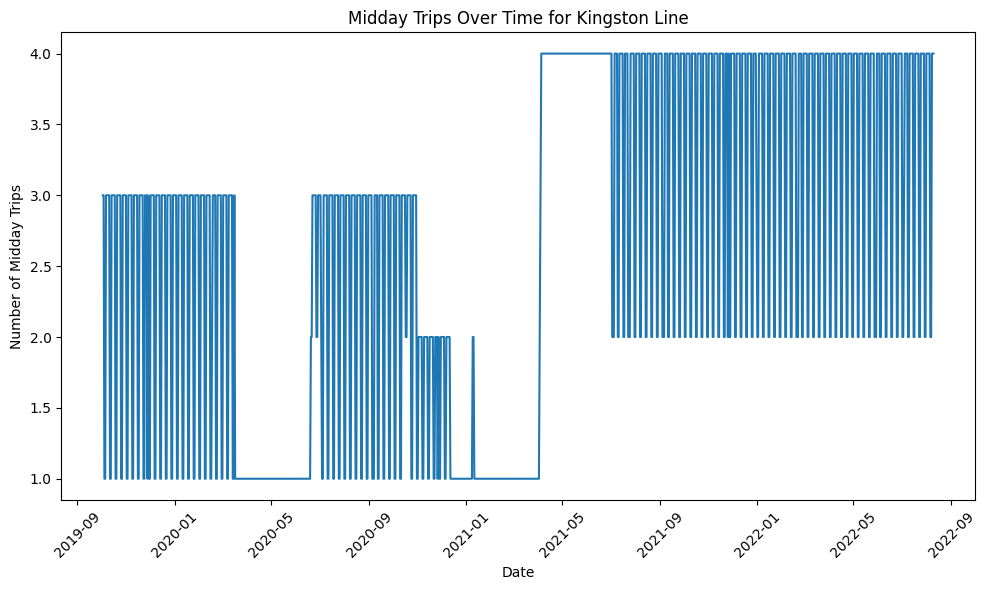

In [153]:
dfKingstonCleaned['date'] = pd.to_datetime(dfKingstonCleaned['date'])

dfKingstonCleaned = dfKingstonCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfKingstonCleaned['date'], dfKingstonCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Kingston Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



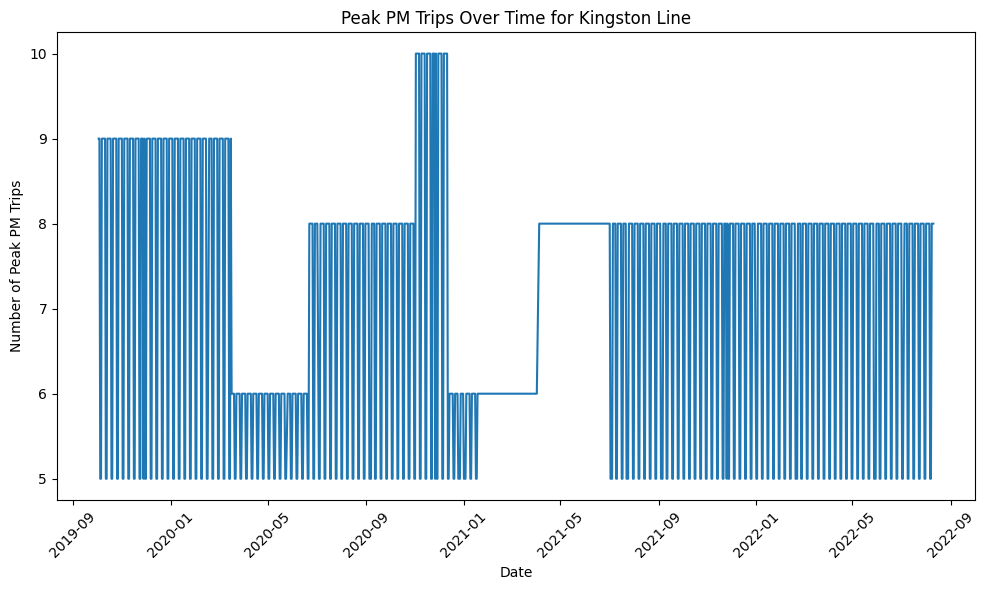

In [154]:
dfKingstonCleaned['date'] = pd.to_datetime(dfKingstonCleaned['date'])

dfKingstonCleaned = dfKingstonCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfKingstonCleaned['date'], dfKingstonCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Kingston Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

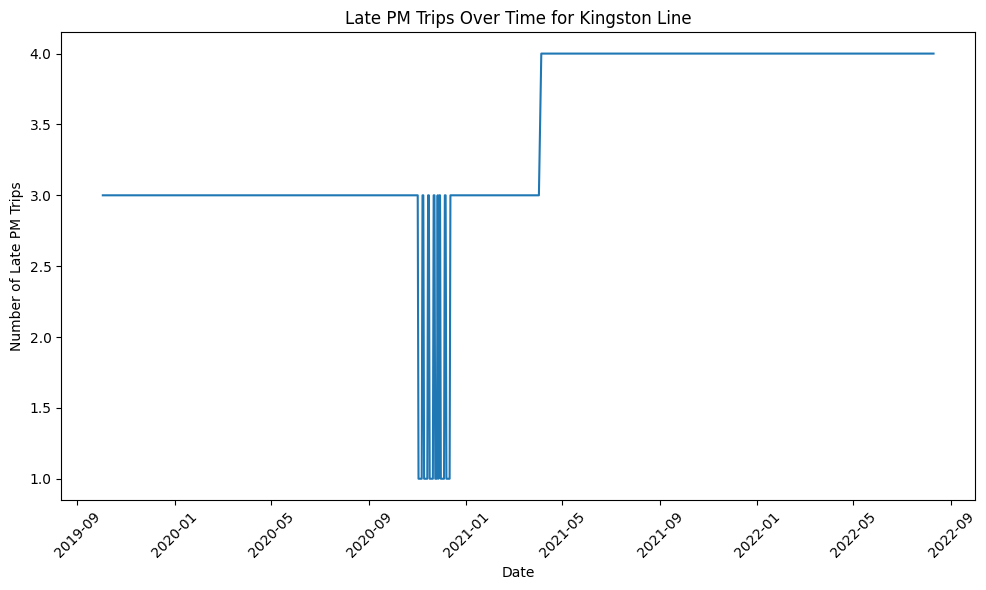

In [155]:
dfKingstonCleaned['date'] = pd.to_datetime(dfKingstonCleaned['date'])

dfKingstonCleaned = dfKingstonCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfKingstonCleaned['date'], dfKingstonCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Kingston Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


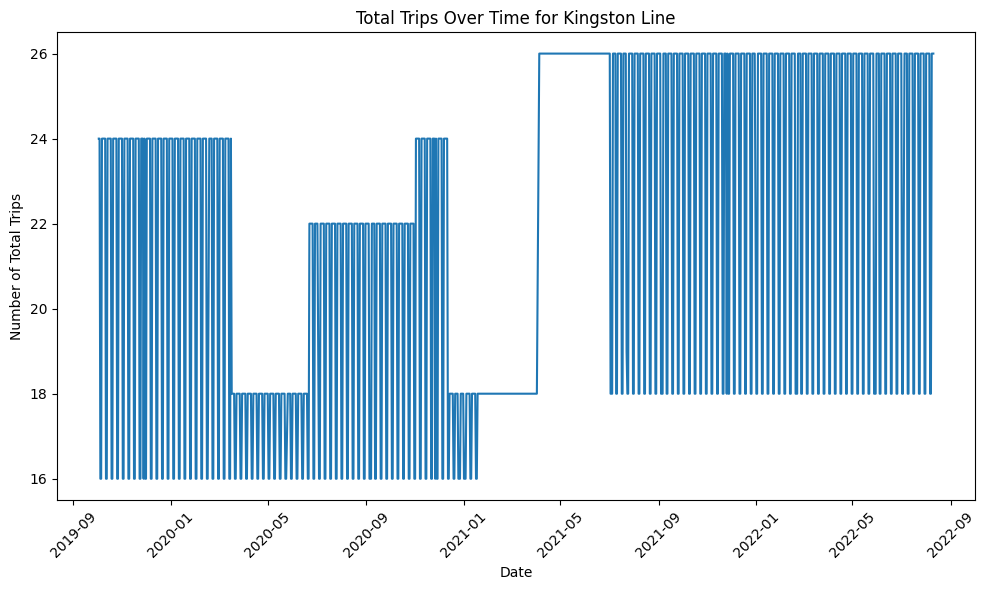

In [156]:
dfKingstonCleaned['date'] = pd.to_datetime(dfKingstonCleaned['date'])

dfKingstonCleaned = dfKingstonCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfKingstonCleaned['date'], dfKingstonCleaned['Total'])
plt.title('Total Trips Over Time for Kingston Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [158]:
csv_file_path = 'updated_Kingston.csv'
dfKingstonCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 8. Haverhill Line

In [159]:
dfHaverhill = pd.read_csv("CR-Haverhill.csv")
dfHaverhill.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2021-09-19,05:51:00,CR-484579-2200-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station
1,2021-09-19,08:51:00,CR-484584-2202-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station
2,2021-09-19,10:51:00,CR-484586-2204-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station
3,2021-09-19,12:51:00,CR-484588-2206-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station
4,2021-09-19,14:51:00,CR-484590-2208-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station


In [160]:
dfHaverhill['time'] = dfHaverhill['time'].apply(adjust_and_convert_time)
dfHaverhill['time'] = pd.to_datetime(dfHaverhill['time'], format='%H:%M:%S').dt.time
dfHaverhill['PartOfDay'] = dfHaverhill['time'].apply(categorize_time_of_day)

dfHaverhill.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-09-19,05:51:00,CR-484579-2200-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station,Early_AM
1,2021-09-19,08:51:00,CR-484584-2202-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station,Peak_AM
2,2021-09-19,10:51:00,CR-484586-2204-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station,Peak_AM
3,2021-09-19,12:51:00,CR-484588-2206-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station,Mid_day
4,2021-09-19,14:51:00,CR-484590-2208-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station,Peak_PM


In [161]:
grouped_df_Haverhill = dfHaverhill.groupby('date')
grouped_df_Haverhill.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-09-19,05:51:00,CR-484579-2200-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station,Early_AM
1,2021-09-19,08:51:00,CR-484584-2202-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station,Peak_AM
2,2021-09-19,10:51:00,CR-484586-2204-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station,Peak_AM
3,2021-09-19,12:51:00,CR-484588-2206-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station,Mid_day
4,2021-09-19,14:51:00,CR-484590-2208-AndoverHaverhill2,line-Haverhill,CR-Haverhill,CR-Haverhill-5c4518ee-1_WR-0329_WR-0228-02_2,Haverhill Line,Andover - North Station,SPR21-N-Su-6-S6561ad1d-AnrHvl,4,1,Andover,North Station,Peak_PM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17171,2021-02-01,19:15:00,CR-Weekday-Winter-21-1208-HaverhillWinchesterM...,line-Haverhill,CR-Haverhill,CR-Haverhill-c7c4b0d8-1,Haverhill Line,Haverhill - North Station via Reading,CR-Wdy-Haverhill-Wtr-21-HvlWnrMsm,4,1,Haverhill,North Station,Peak_PM
17172,2021-02-02,19:15:00,CR-Weekday-Winter-21-1208-HaverhillWinchesterM...,line-Haverhill,CR-Haverhill,CR-Haverhill-c7c4b0d8-1,Haverhill Line,Haverhill - North Station via Reading,CR-Wdy-Haverhill-Wtr-21-HvlWnrMsm,4,1,Haverhill,North Station,Peak_PM
17173,2021-02-03,19:15:00,CR-Weekday-Winter-21-1208-HaverhillWinchesterM...,line-Haverhill,CR-Haverhill,CR-Haverhill-c7c4b0d8-1,Haverhill Line,Haverhill - North Station via Reading,CR-Wdy-Haverhill-Wtr-21-HvlWnrMsm,4,1,Haverhill,North Station,Peak_PM
17174,2021-02-04,19:15:00,CR-Weekday-Winter-21-1208-HaverhillWinchesterM...,line-Haverhill,CR-Haverhill,CR-Haverhill-c7c4b0d8-1,Haverhill Line,Haverhill - North Station via Reading,CR-Wdy-Haverhill-Wtr-21-HvlWnrMsm,4,1,Haverhill,North Station,Peak_PM


In [162]:
partDay = dfHaverhill.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfHaverhill.groupby('date')['route_id'].first()
dfHaverhillCleaned = partDay.join(route_id)
line_id = dfHaverhill.groupby('date')['line_id'].first()
dfHaverhillCleaned = partDay.join(line_id)
dfHaverhillCleaned.reset_index(inplace=True)
dfHaverhillCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,3,4,3,14,18,42,line-Haverhill
1,2019-10-04,3,4,3,14,18,42,line-Haverhill
2,2019-10-05,0,3,1,4,4,12,line-Haverhill
3,2019-10-06,0,3,1,4,4,12,line-Haverhill
4,2019-10-07,3,4,3,14,18,42,line-Haverhill


In [163]:
dfHaverhillCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
982,2022-08-06,1,3,2,5,5,16,line-Haverhill
983,2022-08-07,1,3,2,5,5,16,line-Haverhill
984,2022-08-08,3,4,4,17,17,45,line-Haverhill
985,2022-08-09,3,4,4,17,17,45,line-Haverhill
986,2022-08-10,3,4,4,17,17,45,line-Haverhill


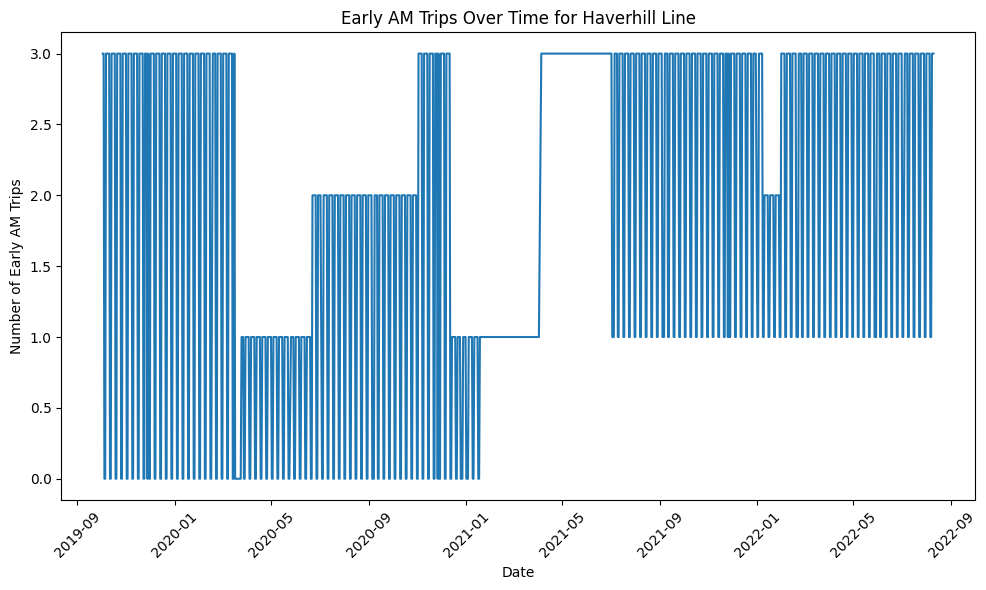

In [164]:
dfHaverhillCleaned['date'] = pd.to_datetime(dfHaverhillCleaned['date'])

dfHaverhillCleaned = dfHaverhillCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfHaverhillCleaned['date'], dfHaverhillCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Haverhill Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

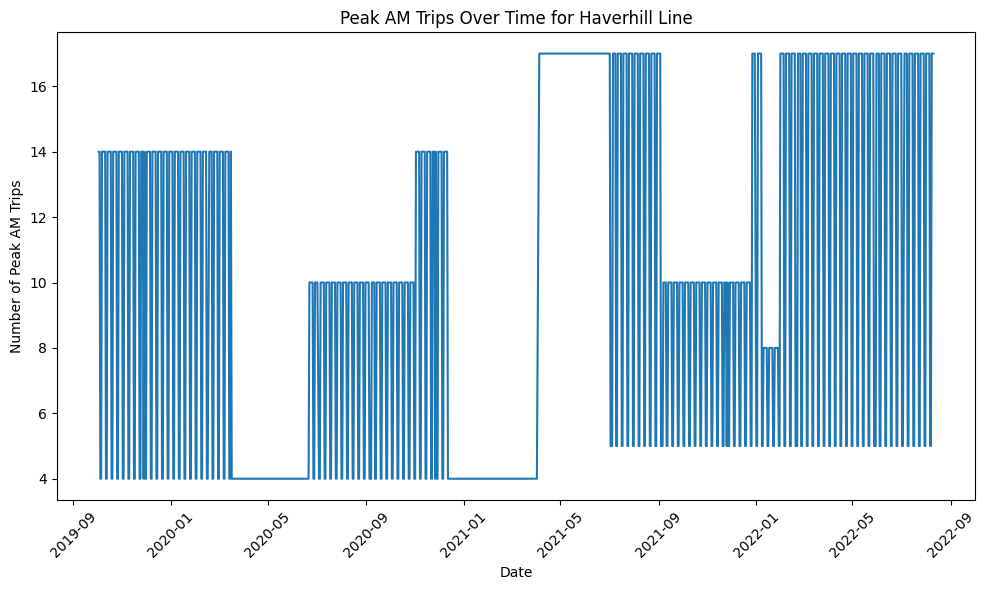

In [165]:
dfHaverhillCleaned['date'] = pd.to_datetime(dfHaverhillCleaned['date'])

dfHaverhillCleaned = dfHaverhillCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfHaverhillCleaned['date'], dfHaverhillCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Haverhill Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


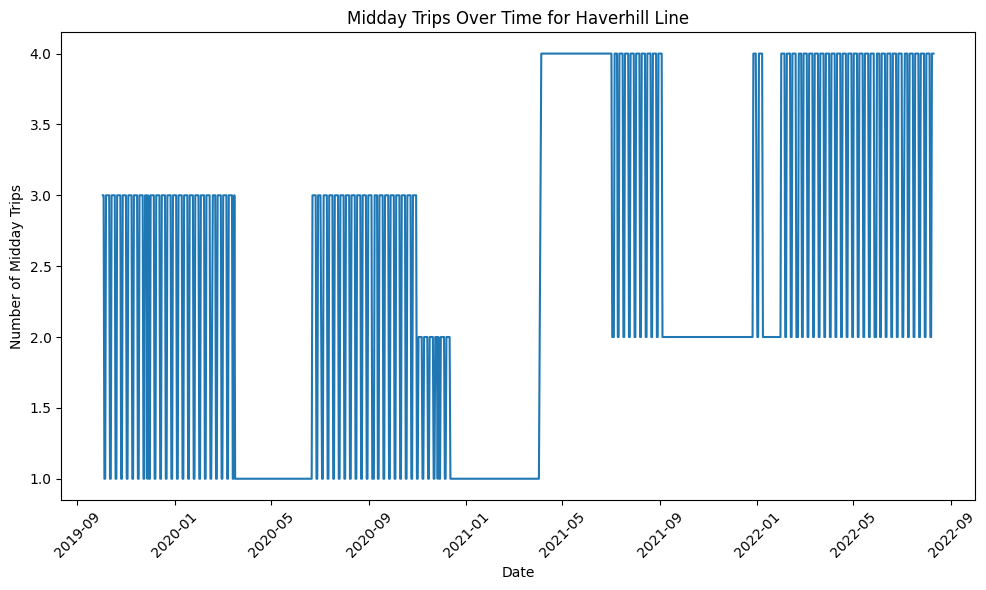

In [166]:
dfHaverhillCleaned['date'] = pd.to_datetime(dfHaverhillCleaned['date'])

dfHaverhillCleaned = dfHaverhillCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfHaverhillCleaned['date'], dfHaverhillCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Haverhill Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



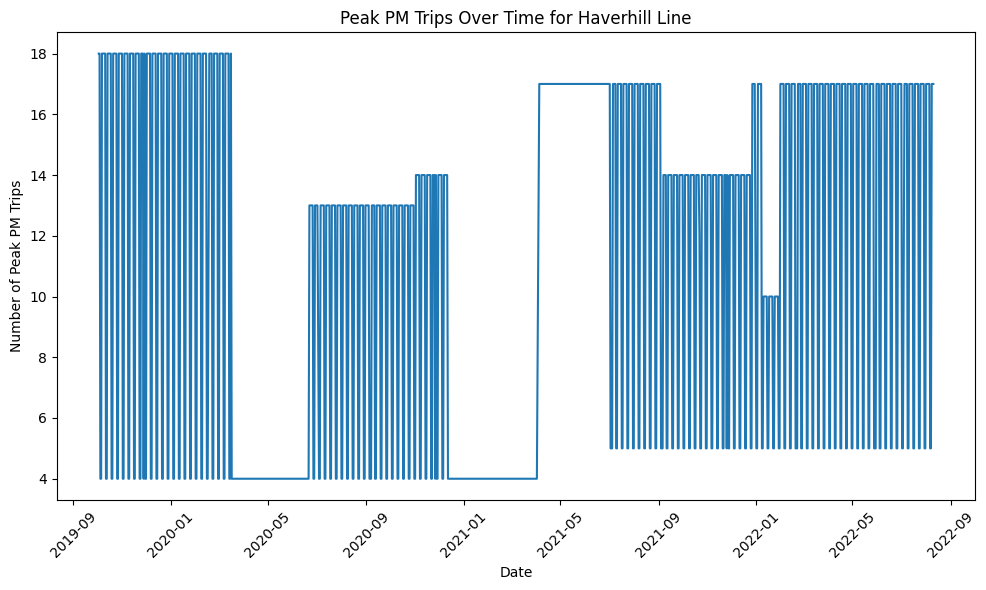

In [167]:
dfHaverhillCleaned['date'] = pd.to_datetime(dfHaverhillCleaned['date'])

dfHaverhillCleaned = dfHaverhillCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfHaverhillCleaned['date'], dfHaverhillCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Haverhill Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

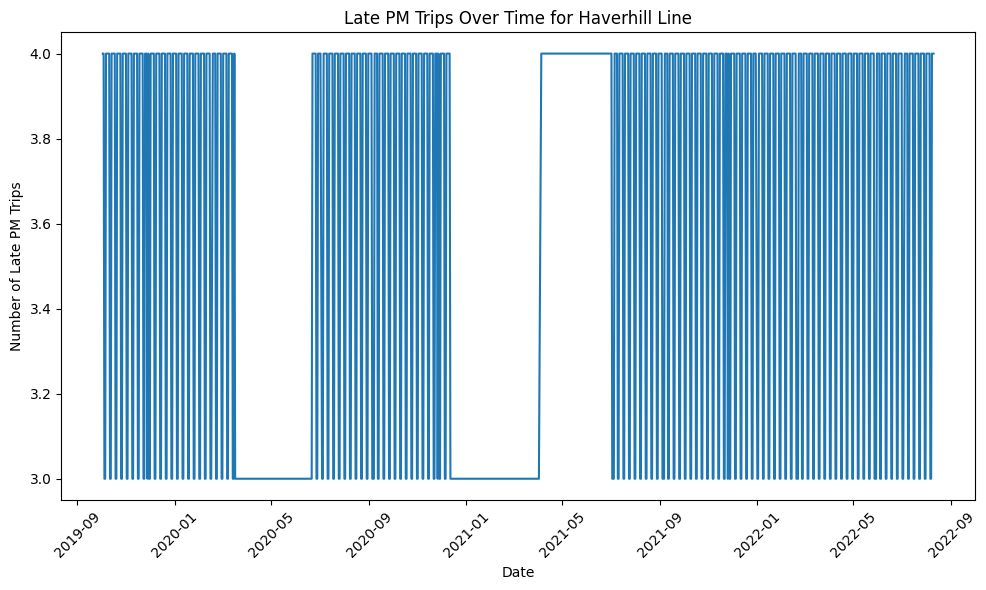

In [168]:
dfHaverhillCleaned['date'] = pd.to_datetime(dfHaverhillCleaned['date'])

dfHaverhillCleaned = dfHaverhillCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfHaverhillCleaned['date'], dfHaverhillCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Haverhill Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


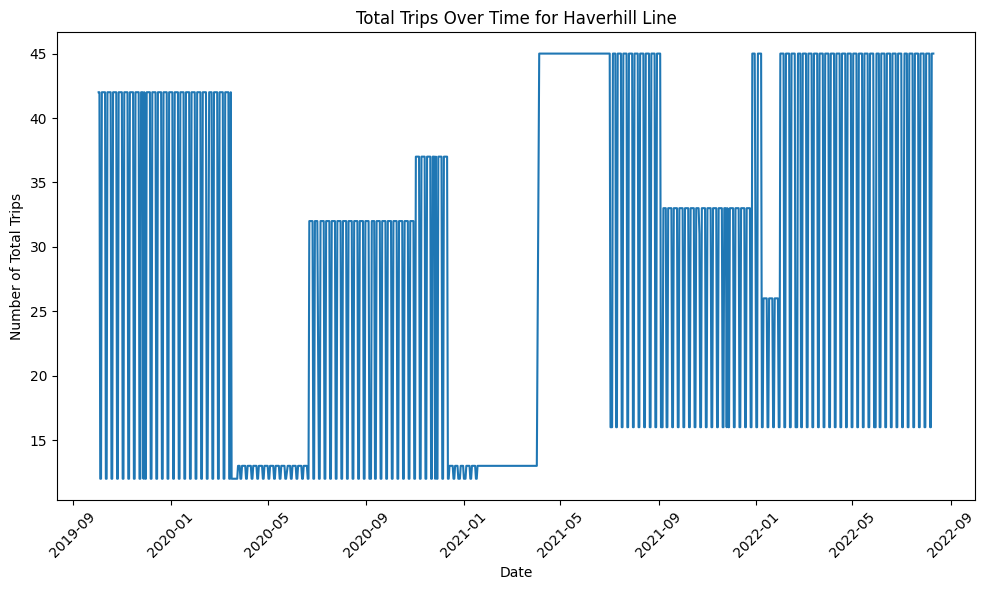

In [169]:
dfHaverhillCleaned['date'] = pd.to_datetime(dfHaverhillCleaned['date'])

dfHaverhillCleaned = dfHaverhillCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfHaverhillCleaned['date'], dfHaverhillCleaned['Total'])
plt.title('Total Trips Over Time for Haverhill Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [170]:
csv_file_path = 'updated_Haverhill.csv'
dfHaverhillCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 9. Greenbush Line

In [171]:
dfGreenbush = pd.read_csv("CR-Greenbush.csv")
dfGreenbush.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2020-10-18,08:19:00,CR-Sunday-DivOldColony-20-2071C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush
1,2020-10-18,09:59:00,CR-Sunday-DivOldColony-20-2073C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush
2,2020-10-18,11:17:00,CR-Sunday-DivOldColony-20-2075C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush
3,2020-10-18,13:09:00,CR-Sunday-DivOldColony-20-2077C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush
4,2020-10-18,14:59:00,CR-Sunday-DivOldColony-20-2079C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush


In [172]:
dfGreenbush['time'] = dfGreenbush['time'].apply(adjust_and_convert_time)
dfGreenbush['time'] = pd.to_datetime(dfGreenbush['time'], format='%H:%M:%S').dt.time
dfGreenbush['PartOfDay'] = dfGreenbush['time'].apply(categorize_time_of_day)

dfGreenbush.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2020-10-18,08:19:00,CR-Sunday-DivOldColony-20-2071C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush,Peak_AM
1,2020-10-18,09:59:00,CR-Sunday-DivOldColony-20-2073C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush,Peak_AM
2,2020-10-18,11:17:00,CR-Sunday-DivOldColony-20-2075C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush,Peak_AM
3,2020-10-18,13:09:00,CR-Sunday-DivOldColony-20-2077C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush,Mid_day
4,2020-10-18,14:59:00,CR-Sunday-DivOldColony-20-2079C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush,Peak_PM


In [173]:
grouped_df_Greenbush = dfGreenbush.groupby('date')
grouped_df_Greenbush.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2020-10-18,08:19:00,CR-Sunday-DivOldColony-20-2071C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush,Peak_AM
1,2020-10-18,09:59:00,CR-Sunday-DivOldColony-20-2073C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush,Peak_AM
2,2020-10-18,11:17:00,CR-Sunday-DivOldColony-20-2075C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush,Peak_AM
3,2020-10-18,13:09:00,CR-Sunday-DivOldColony-20-2077C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush,Mid_day
4,2020-10-18,14:59:00,CR-Sunday-DivOldColony-20-2079C0,line-Greenbush,CR-Greenbush,CR-Greenbush-30d06576-0,Greenbush Line,Braintree - Greenbush,CR-Su-Greenbush-DivOldColony-20C0,4,0,Braintree,Greenbush,Peak_PM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10432,2020-06-15,06:15:00,CR-Weekday-StormB-19-7070C0-GreenbushSouthStation,line-Greenbush,CR-Greenbush,CR-Greenbush-69dd7df3-1,Greenbush Line,Greenbush - South Station,CR-Wdy-Greenbush-StormB-19C0-GrhSthStn,4,1,Greenbush,South Station,Peak_AM
10433,2020-06-16,06:15:00,CR-Weekday-StormB-19-7070C0-GreenbushSouthStation,line-Greenbush,CR-Greenbush,CR-Greenbush-69dd7df3-1,Greenbush Line,Greenbush - South Station,CR-Wdy-Greenbush-StormB-19C0-GrhSthStn,4,1,Greenbush,South Station,Peak_AM
10434,2020-06-17,06:15:00,CR-Weekday-StormB-19-7070C0-GreenbushSouthStation,line-Greenbush,CR-Greenbush,CR-Greenbush-69dd7df3-1,Greenbush Line,Greenbush - South Station,CR-Wdy-Greenbush-StormB-19C0-GrhSthStn,4,1,Greenbush,South Station,Peak_AM
10435,2020-06-18,06:15:00,CR-Weekday-StormB-19-7070C0-GreenbushSouthStation,line-Greenbush,CR-Greenbush,CR-Greenbush-69dd7df3-1,Greenbush Line,Greenbush - South Station,CR-Wdy-Greenbush-StormB-19C0-GrhSthStn,4,1,Greenbush,South Station,Peak_AM


In [174]:
partDay = dfGreenbush.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfGreenbush.groupby('date')['route_id'].first()
dfGreenbushCleaned = partDay.join(route_id)
line_id = dfGreenbush.groupby('date')['line_id'].first()
dfGreenbushCleaned = partDay.join(line_id)
dfGreenbushCleaned.reset_index(inplace=True)
dfGreenbushCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,1,3,1,9,10,24,line-Greenbush
1,2019-10-04,1,3,1,9,10,24,line-Greenbush
2,2019-10-05,0,3,2,6,5,16,line-Greenbush
3,2019-10-06,0,3,2,6,5,16,line-Greenbush
4,2019-10-07,1,3,1,9,10,24,line-Greenbush


In [175]:
dfGreenbushCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
964,2022-08-06,1,2,2,5,6,16,line-Greenbush
965,2022-08-07,1,2,2,5,6,16,line-Greenbush
966,2022-08-08,1,3,2,11,9,26,line-Greenbush
967,2022-08-09,1,3,2,11,9,26,line-Greenbush
968,2022-08-10,1,3,2,11,9,26,line-Greenbush


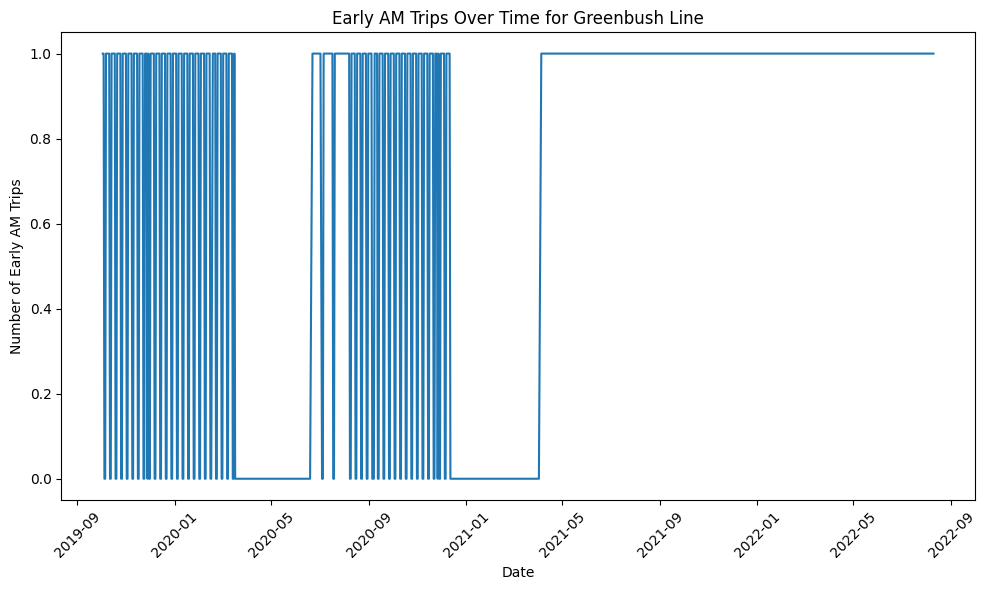

In [176]:
dfGreenbushCleaned['date'] = pd.to_datetime(dfGreenbushCleaned['date'])

dfGreenbushCleaned = dfGreenbushCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfGreenbushCleaned['date'], dfGreenbushCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Greenbush Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

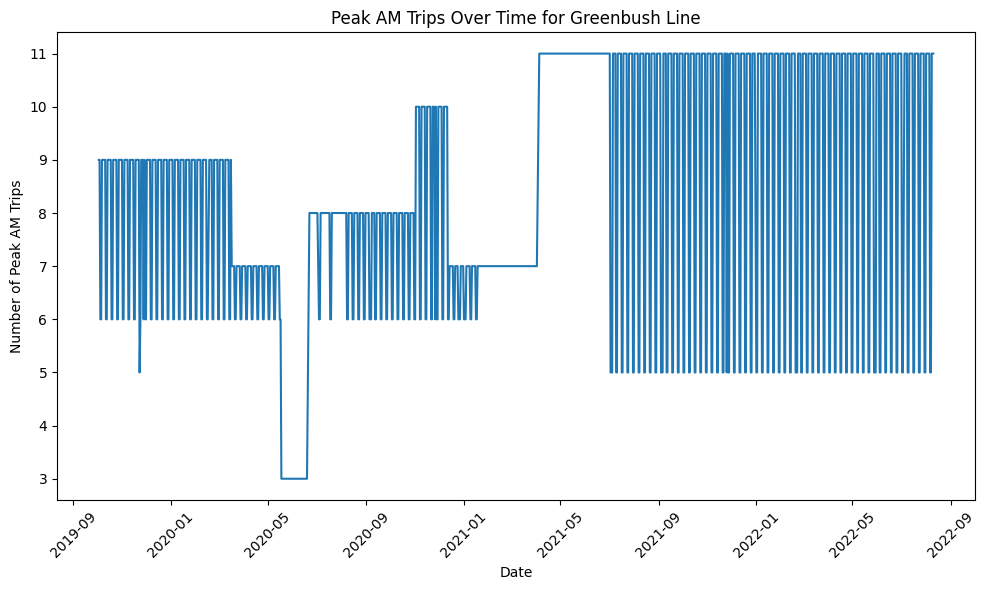

In [177]:
dfGreenbushCleaned['date'] = pd.to_datetime(dfGreenbushCleaned['date'])

dfGreenbushCleaned = dfGreenbushCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfGreenbushCleaned['date'], dfGreenbushCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Greenbush Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


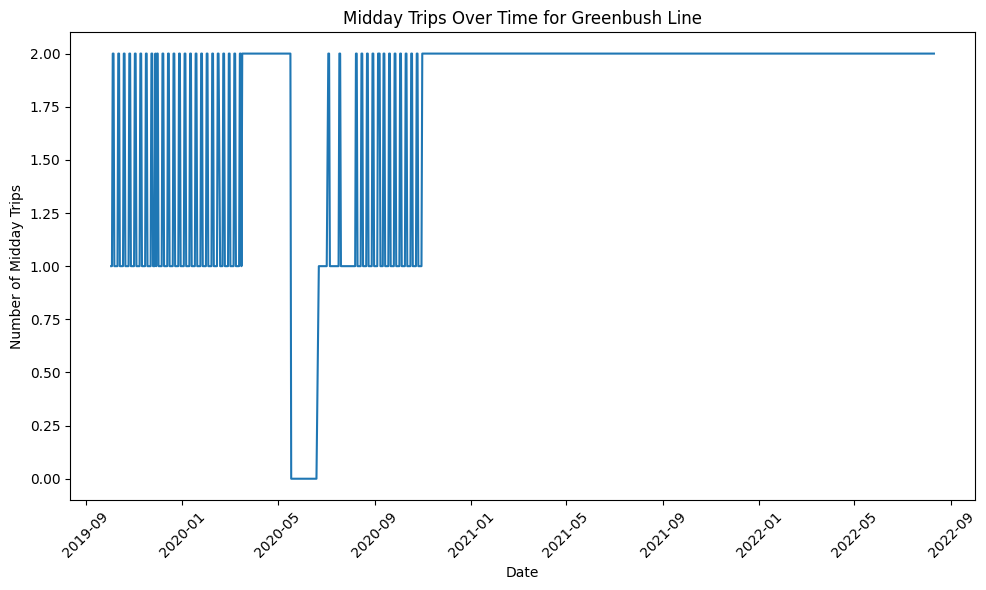

In [178]:
dfGreenbushCleaned['date'] = pd.to_datetime(dfGreenbushCleaned['date'])

dfGreenbushCleaned = dfGreenbushCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfGreenbushCleaned['date'], dfGreenbushCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Greenbush Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



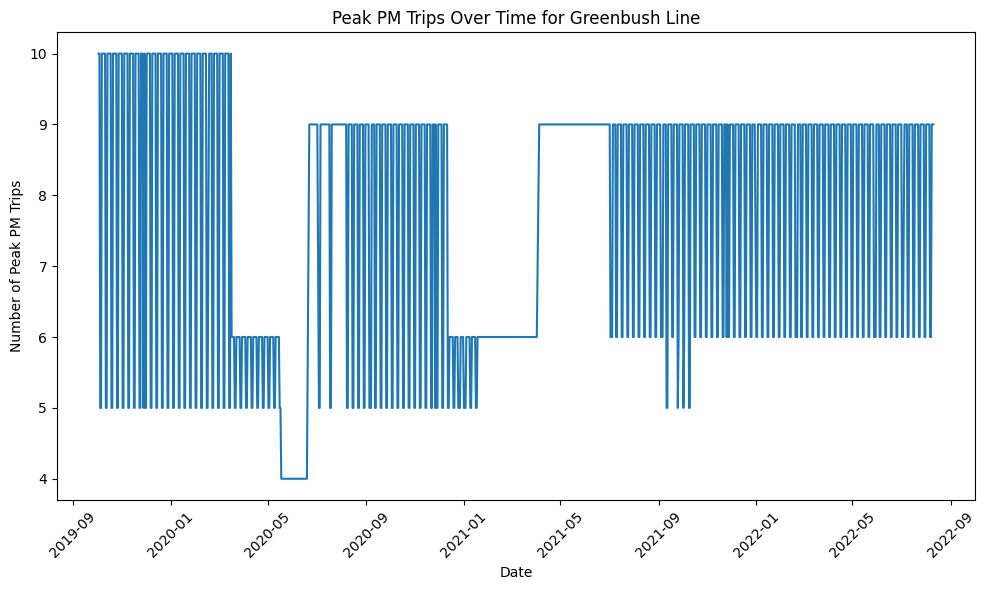

In [179]:
dfGreenbushCleaned['date'] = pd.to_datetime(dfGreenbushCleaned['date'])

dfGreenbushCleaned = dfGreenbushCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfGreenbushCleaned['date'], dfGreenbushCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Greenbush Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

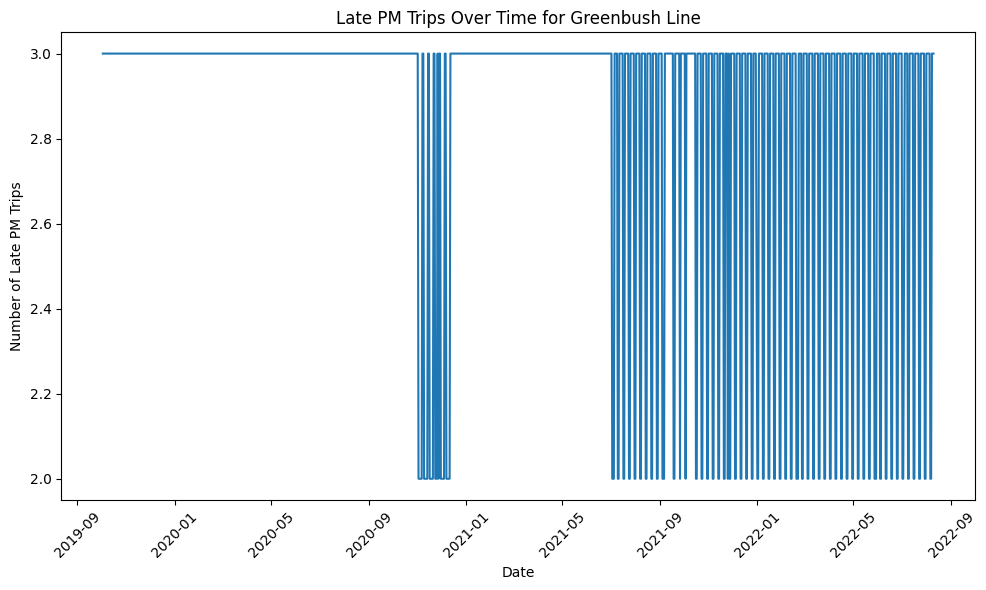

In [180]:
dfGreenbushCleaned['date'] = pd.to_datetime(dfGreenbushCleaned['date'])

dfGreenbushCleaned = dfGreenbushCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfGreenbushCleaned['date'], dfGreenbushCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Greenbush Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


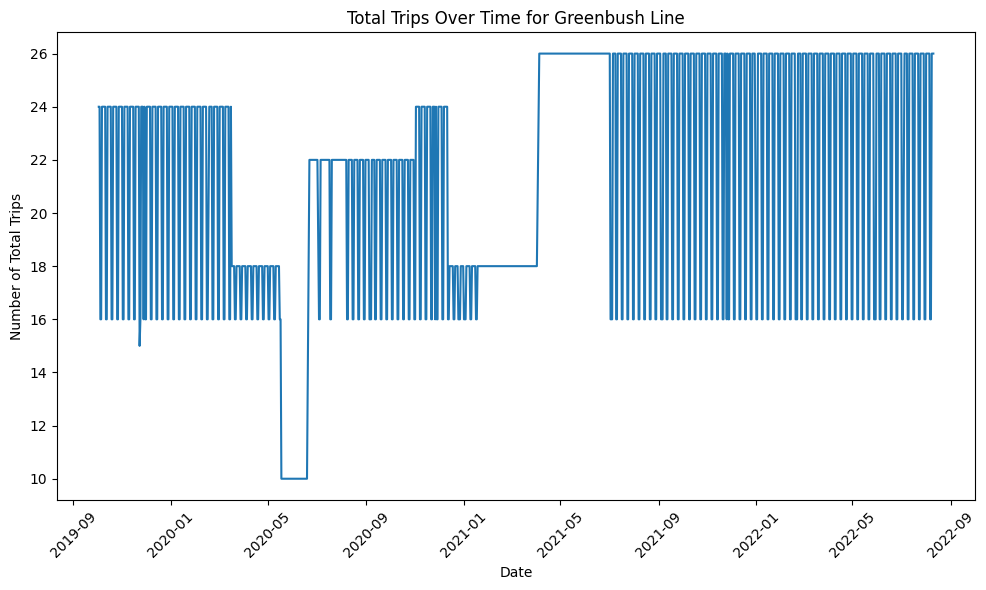

In [181]:
dfGreenbushCleaned['date'] = pd.to_datetime(dfGreenbushCleaned['date'])

dfGreenbushCleaned = dfGreenbushCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfGreenbushCleaned['date'], dfGreenbushCleaned['Total'])
plt.title('Total Trips Over Time for Greenbush Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [182]:
csv_file_path = 'updated_Greenbush.csv'
dfGreenbushCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 10. Franklin Line

In [183]:
dfFranklin = pd.read_csv("CR-Franklin.csv")
dfFranklin.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2020-11-08,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole
1,2020-11-22,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole
2,2020-11-29,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20,4,0,South Station,Walpole
3,2020-12-06,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole
4,2020-12-13,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole


In [184]:
dfFranklin['time'] = dfFranklin['time'].apply(adjust_and_convert_time)
dfFranklin['time'] = pd.to_datetime(dfFranklin['time'], format='%H:%M:%S').dt.time
dfFranklin['PartOfDay'] = dfFranklin['time'].apply(categorize_time_of_day)

dfFranklin.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2020-11-08,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole,Peak_AM
1,2020-11-22,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole,Peak_AM
2,2020-11-29,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20,4,0,South Station,Walpole,Peak_AM
3,2020-12-06,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole,Peak_AM
4,2020-12-13,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole,Peak_AM


In [185]:
grouped_df_Franklin = dfFranklin.groupby('date')
grouped_df_Franklin.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2020-11-08,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole,Peak_AM
1,2020-11-22,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole,Peak_AM
2,2020-11-29,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20,4,0,South Station,Walpole,Peak_AM
3,2020-12-06,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole,Peak_AM
4,2020-12-13,11:20:00,CR-Sunday-Fall-20-2707-ForgeParkWalpole0,line-Franklin,CR-Franklin,CR-Franklin-68fb51e7-0_Walpole_Forge Park / 495_0,Franklin Line,South Station - Walpole,CR-Su-Franklin-Fll-20-FrgPrkWll,4,0,South Station,Walpole,Peak_AM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20426,2022-05-08,10:12:00,CR-502607-2704-ReadvilleSouthStationFMT,line-Franklin,CR-Franklin,CR-Franklin-efecf2cd-1,Franklin Line,Forge Park/495 - South Station via Back Bay,FLL 21-S-Su-1-RdlSthStnFMT,4,1,Forge Park/495,South Station,Peak_AM
20427,2022-05-01,14:12:00,CR-502611-2708-ReadvilleSouthStationFMT,line-Franklin,CR-Franklin,CR-Franklin-efecf2cd-1,Franklin Line,Forge Park/495 - South Station via Back Bay,FLL 21-S-Su-1-RdlSthStnFMT,4,1,Forge Park/495,South Station,Peak_PM
20428,2022-05-08,14:12:00,CR-502611-2708-ReadvilleSouthStationFMT,line-Franklin,CR-Franklin,CR-Franklin-efecf2cd-1,Franklin Line,Forge Park/495 - South Station via Back Bay,FLL 21-S-Su-1-RdlSthStnFMT,4,1,Forge Park/495,South Station,Peak_PM
20429,2022-05-01,18:12:00,CR-502615-2712-ReadvilleSouthStationFMT,line-Franklin,CR-Franklin,CR-Franklin-efecf2cd-1,Franklin Line,Forge Park/495 - South Station via Back Bay,FLL 21-S-Su-1-RdlSthStnFMT,4,1,Forge Park/495,South Station,Peak_PM


In [186]:
partDay = dfFranklin.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfFranklin.groupby('date')['route_id'].first()
dfFranklinCleaned = partDay.join(route_id)
line_id = dfFranklin.groupby('date')['line_id'].first()
dfFranklinCleaned = partDay.join(line_id)
dfFranklinCleaned.reset_index(inplace=True)
dfFranklinCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,3,6,4,12,15,40,line-Franklin
1,2019-10-04,3,6,4,12,15,40,line-Franklin
2,2019-10-07,3,6,4,12,15,40,line-Franklin
3,2019-10-08,3,6,4,12,15,40,line-Franklin
4,2019-10-09,3,6,4,12,15,40,line-Franklin


In [187]:
dfFranklinCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
925,2022-08-06,1,4,2,5,6,18,line-Franklin
926,2022-08-07,1,4,2,5,6,18,line-Franklin
927,2022-08-08,2,6,4,14,12,38,line-Franklin
928,2022-08-09,2,6,4,14,12,38,line-Franklin
929,2022-08-10,2,6,4,14,12,38,line-Franklin


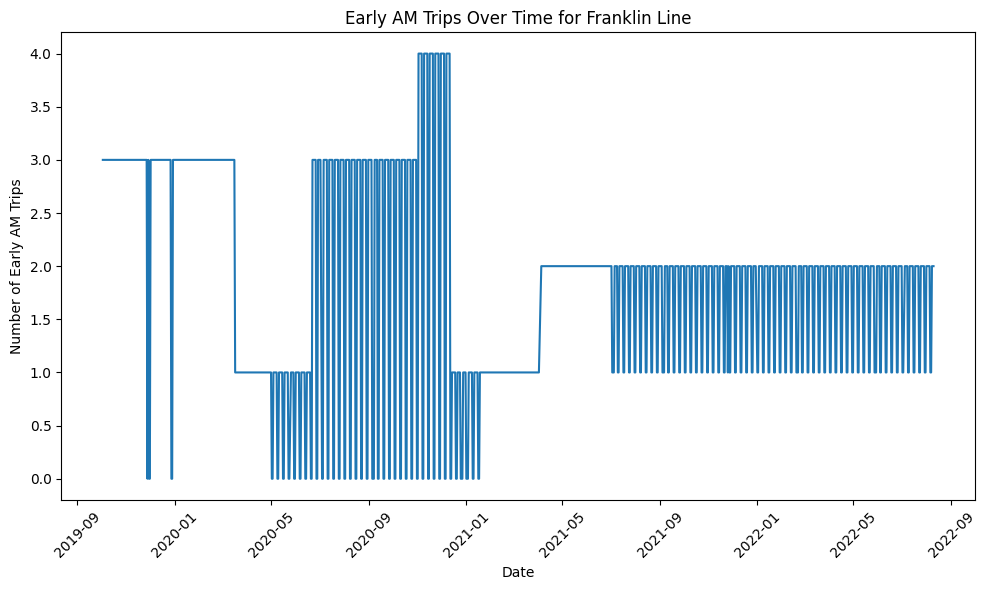

In [188]:
dfFranklinCleaned['date'] = pd.to_datetime(dfFranklinCleaned['date'])

dfFranklinCleaned = dfFranklinCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFranklinCleaned['date'], dfFranklinCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Franklin Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

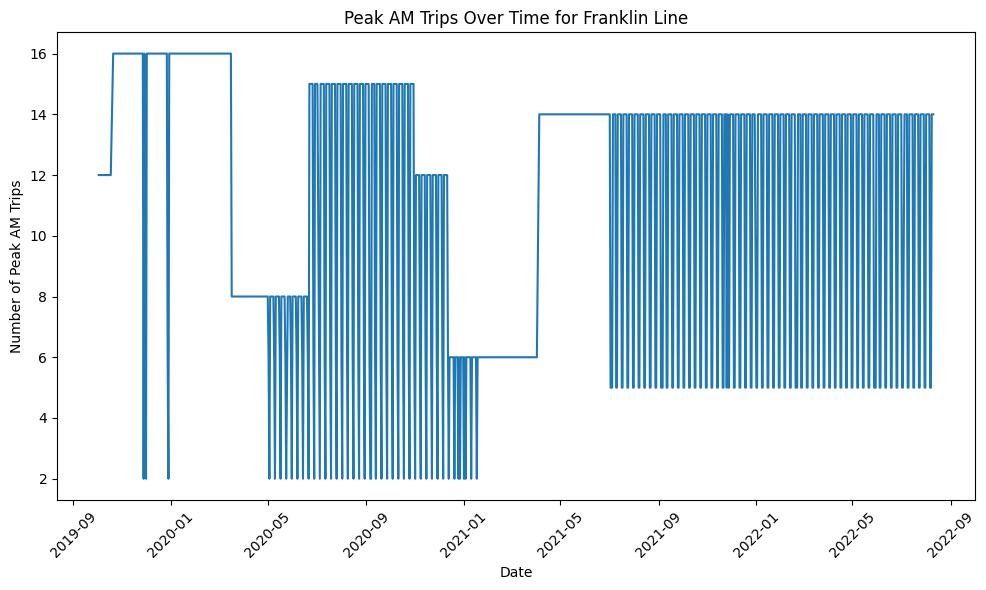

In [189]:
dfFranklinCleaned['date'] = pd.to_datetime(dfFranklinCleaned['date'])

dfFranklinCleaned = dfFranklinCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFranklinCleaned['date'], dfFranklinCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Franklin Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


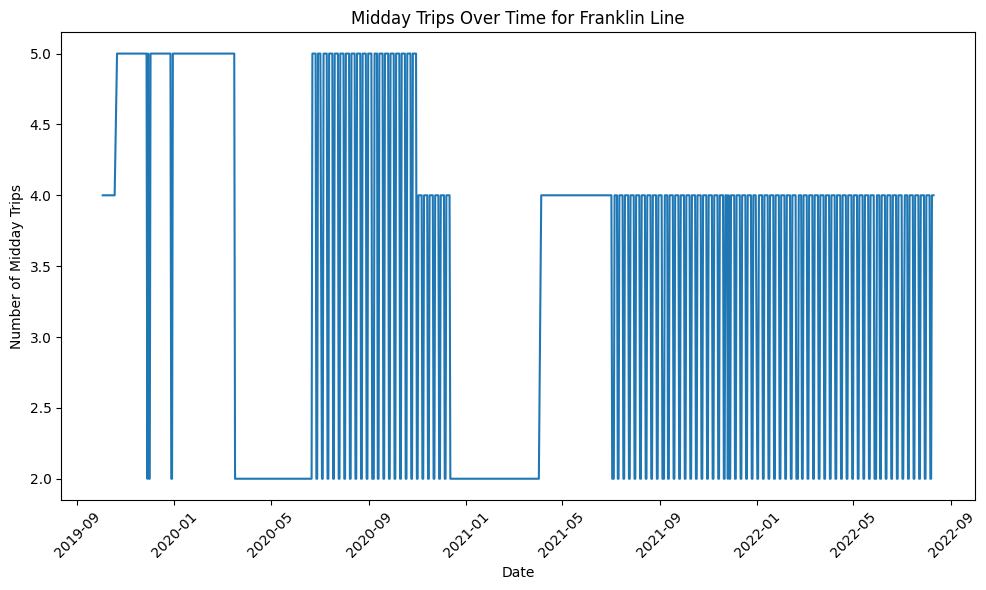

In [190]:
dfFranklinCleaned['date'] = pd.to_datetime(dfFranklinCleaned['date'])

dfFranklinCleaned = dfFranklinCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFranklinCleaned['date'], dfFranklinCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Franklin Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



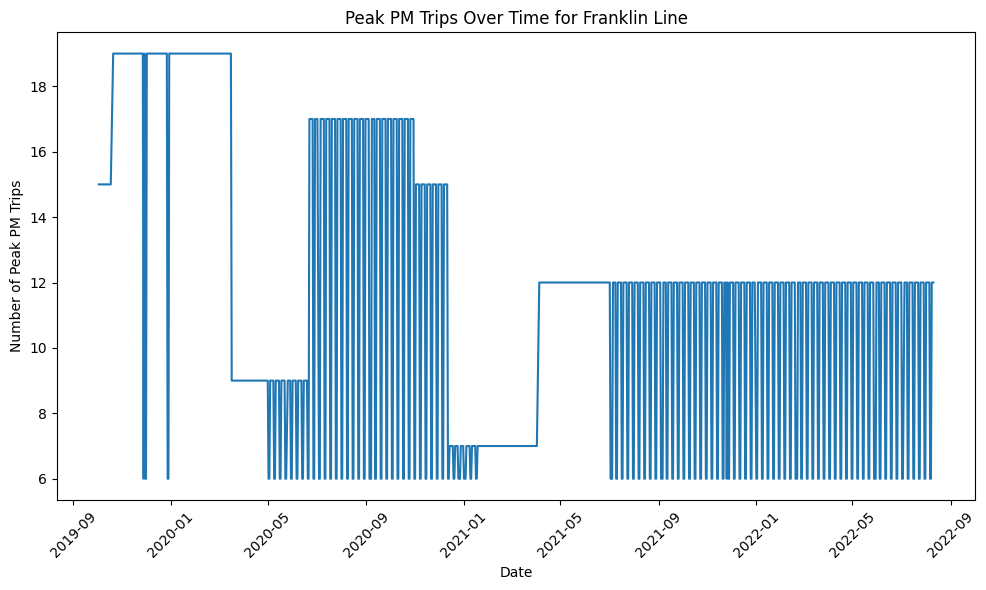

In [191]:
dfFranklinCleaned['date'] = pd.to_datetime(dfFranklinCleaned['date'])

dfFranklinCleaned = dfFranklinCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFranklinCleaned['date'], dfFranklinCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Franklin Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

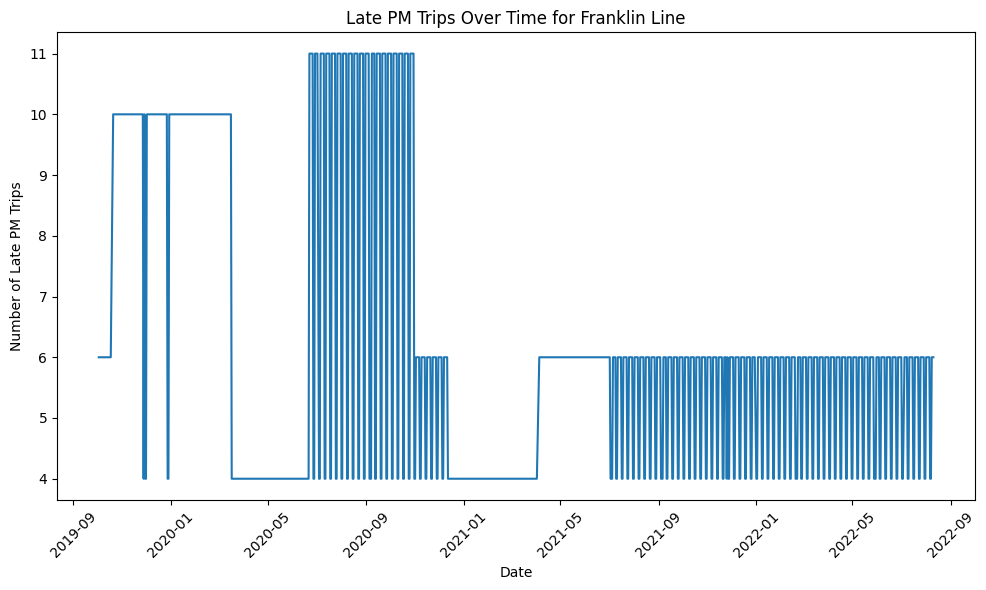

In [192]:
dfFranklinCleaned['date'] = pd.to_datetime(dfFranklinCleaned['date'])

dfFranklinCleaned = dfFranklinCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFranklinCleaned['date'], dfFranklinCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Franklin Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


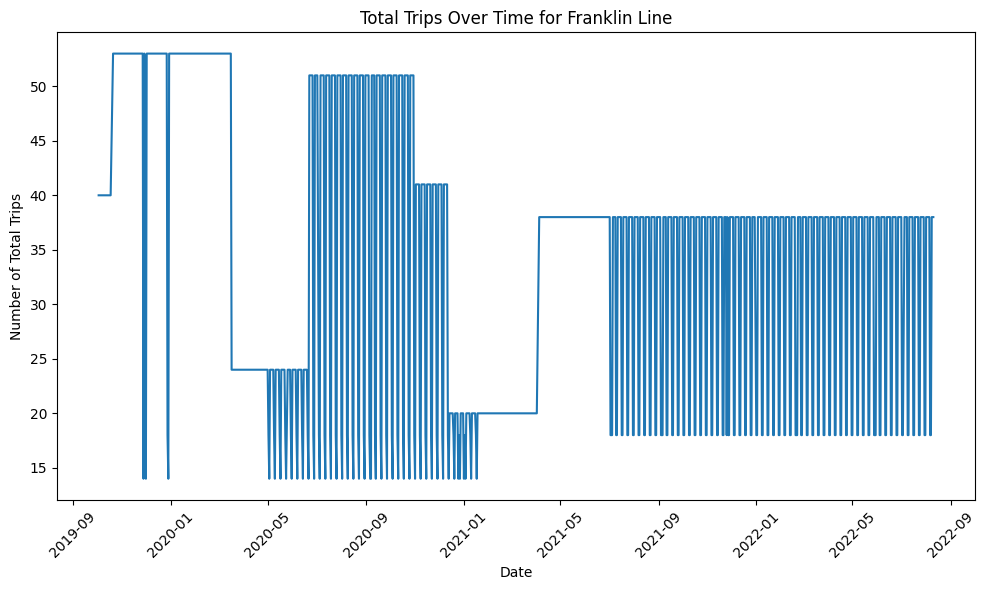

In [193]:
dfFranklinCleaned['date'] = pd.to_datetime(dfFranklinCleaned['date'])

dfFranklinCleaned = dfFranklinCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFranklinCleaned['date'], dfFranklinCleaned['Total'])
plt.title('Total Trips Over Time for Franklin Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [194]:
csv_file_path = 'updated_Franklin.csv'
dfFranklinCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 11. Foxboro Line

In [195]:
dfFoxboro = pd.read_csv("CR-Foxboro.csv")
dfFoxboro.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2019-10-10,18:00:00,CR-Foxboro-Sunday-2020-9781,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-2020,2,0,South Station,Foxboro
1,2019-10-27,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro
2,2019-11-24,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro
3,2019-12-08,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro
4,2019-12-21,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro


In [196]:
dfFoxboro['time'] = dfFoxboro['time'].apply(adjust_and_convert_time)
dfFoxboro['time'] = pd.to_datetime(dfFoxboro['time'], format='%H:%M:%S').dt.time
dfFoxboro['PartOfDay'] = dfFoxboro['time'].apply(categorize_time_of_day)

dfFoxboro.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2019-10-10,18:00:00,CR-Foxboro-Sunday-2020-9781,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-2020,2,0,South Station,Foxboro,Peak_PM
1,2019-10-27,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro,Peak_PM
2,2019-11-24,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro,Peak_PM
3,2019-12-08,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro,Peak_PM
4,2019-12-21,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro,Peak_PM


In [197]:
grouped_df_Foxboro = dfFoxboro.groupby('date')
grouped_df_Foxboro.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2019-10-10,18:00:00,CR-Foxboro-Sunday-2020-9781,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-2020,2,0,South Station,Foxboro,Peak_PM
1,2019-10-27,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro,Peak_PM
2,2019-11-24,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro,Peak_PM
3,2019-12-08,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro,Peak_PM
4,2019-12-21,14:00:00,CR-Foxboro-Sunday-1625-9743,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1625,2,0,South Station,Foxboro,Peak_PM
5,2019-12-29,10:15:00,CR-Foxboro-Sunday-1300-9711,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-1300,2,0,South Station,Foxboro,Peak_AM
6,2020-01-04,17:50:00,CR-Foxboro-Sunday-2030-9783,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station - Foxboro via Back Bay & Dedham,CR-Foxboro-Su-2030,2,0,South Station,Foxboro,Peak_PM
7,2021-09-12,14:10:00,CR-Foxboro16:25-0-14:10:00,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station or Foxboro - Foxboro or Providence,SPR21-S-Su-Fx5,4,0,South Station,Foxboro,Peak_PM
8,2021-09-26,10:35:00,CR-Foxboro13:00-0-10:35:00,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station or Foxboro - Foxboro or Providence,SPR21-S-Su-Foxboro13:00,4,0,South Station,Foxboro,Peak_AM
9,2021-10-03,18:10:00,CR-Foxboro20:20-0-18:10:00,line-Foxboro,CR-Foxboro,CR-Foxboro-0-0,Foxboro Event Service,South Station or Foxboro - Foxboro or Providence,SPR21-S-Su-Fx0,4,0,South Station,Foxboro,Peak_PM


In [198]:
partDay = dfFoxboro.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfFoxboro.groupby('date')['route_id'].first()
dfFoxboroCleaned = partDay.join(route_id)
line_id = dfFoxboro.groupby('date')['line_id'].first()
dfFoxboroCleaned = partDay.join(line_id)
dfFoxboroCleaned.reset_index(inplace=True)
dfFoxboroCleaned.head(5)

,date,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-10,0,0,2,2,line-Foxboro
1,2019-10-27,0,0,2,2,line-Foxboro
2,2019-11-24,0,0,2,2,line-Foxboro
3,2019-12-08,0,0,2,2,line-Foxboro
4,2019-12-21,0,0,2,2,line-Foxboro


In [199]:
dfFoxboroCleaned.tail(5)

,date,Mid_day,Peak_AM,Peak_PM,Total,line_id
15,2021-11-28,0,2,0,2,line-Foxboro
16,2021-12-26,0,2,0,2,line-Foxboro
17,2022-01-02,0,2,0,2,line-Foxboro
18,2022-07-27,0,0,1,1,line-Foxboro
19,2022-07-28,0,0,1,1,line-Foxboro


In [200]:
dfFoxboroCleaned['date'] = pd.to_datetime(dfFoxboroCleaned['date'])

dfFoxboroCleaned = dfFoxboroCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFoxboroCleaned['date'], dfFoxboroCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Foxboro Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

KeyError: 'Early_AM'

<Figure size 1000x600 with 0 Axes>

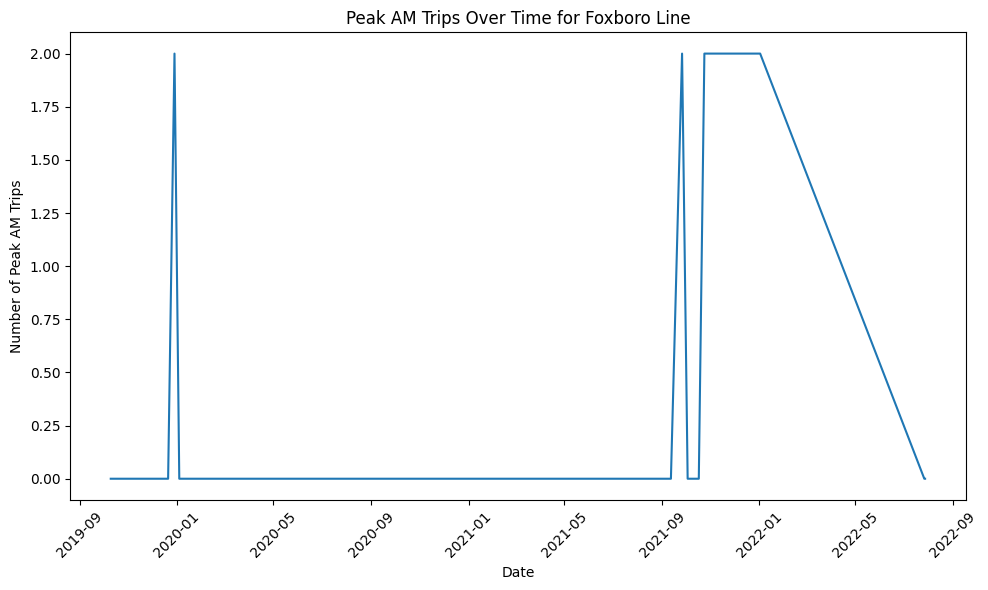

In [201]:
dfFoxboroCleaned['date'] = pd.to_datetime(dfFoxboroCleaned['date'])

dfFoxboroCleaned = dfFoxboroCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFoxboroCleaned['date'], dfFoxboroCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Foxboro Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


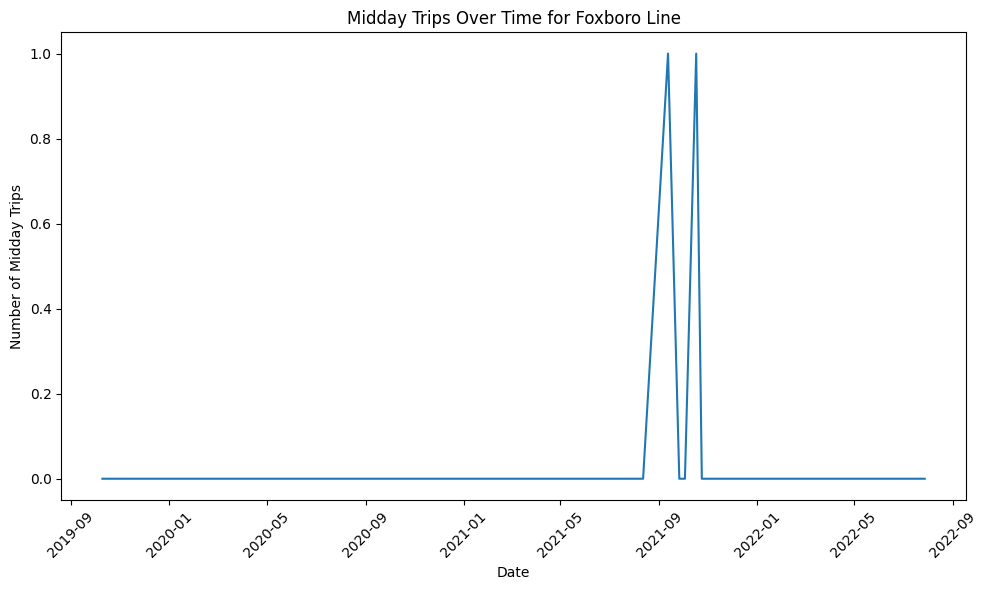

In [202]:
dfFoxboroCleaned['date'] = pd.to_datetime(dfFoxboroCleaned['date'])

dfFoxboroCleaned = dfFoxboroCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFoxboroCleaned['date'], dfFoxboroCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Foxboro Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



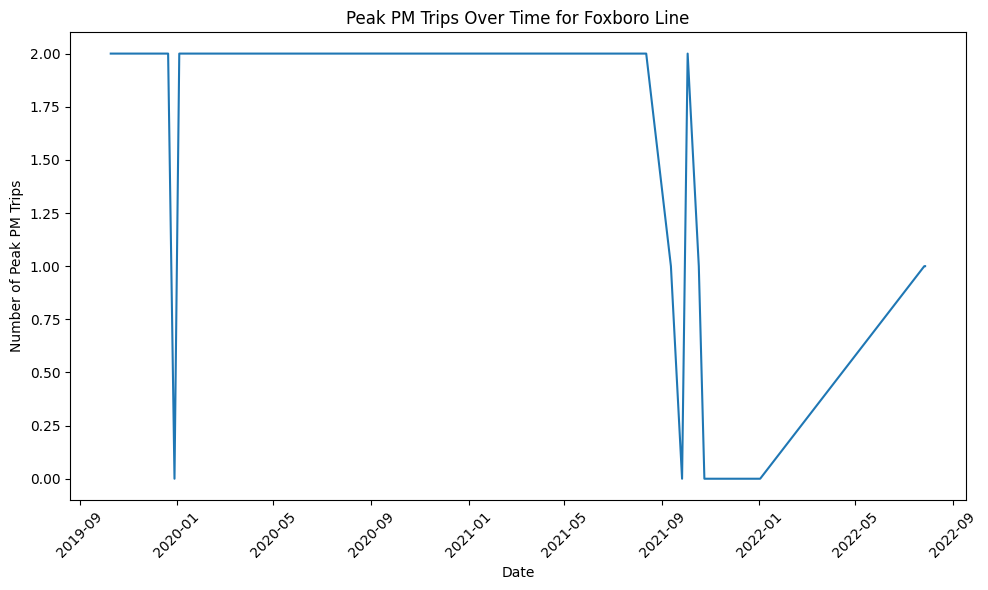

In [203]:
dfFoxboroCleaned['date'] = pd.to_datetime(dfFoxboroCleaned['date'])

dfFoxboroCleaned = dfFoxboroCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFoxboroCleaned['date'], dfFoxboroCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Foxboro Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [204]:
dfFoxboroCleaned['date'] = pd.to_datetime(dfFoxboroCleaned['date'])

dfFoxboroCleaned = dfFoxboroCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFoxboroCleaned['date'], dfFoxboroCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Foxboro Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


KeyError: 'Late_PM'

<Figure size 1000x600 with 0 Axes>

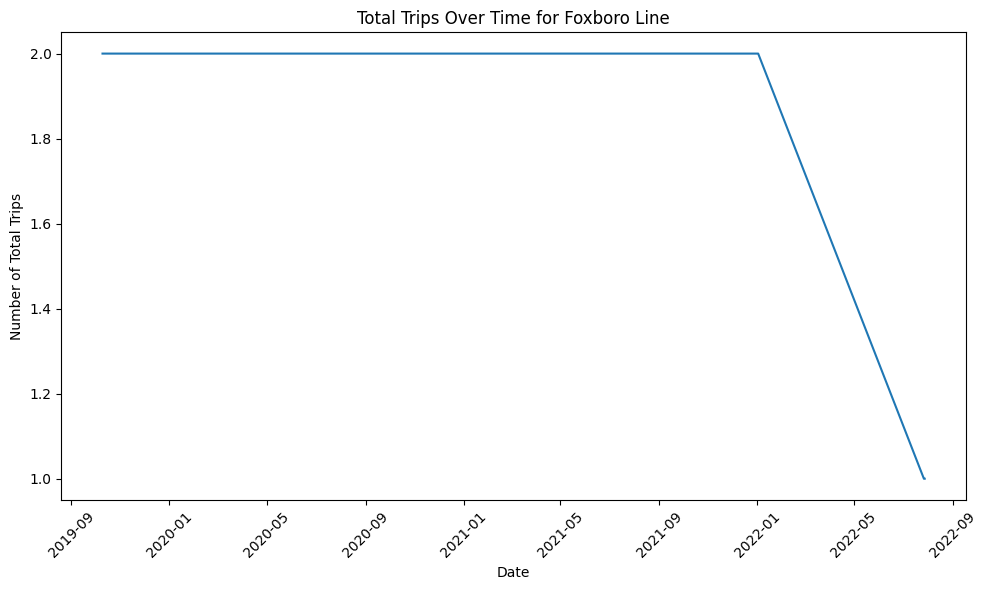

In [205]:
dfFoxboroCleaned['date'] = pd.to_datetime(dfFoxboroCleaned['date'])

dfFoxboroCleaned = dfFoxboroCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFoxboroCleaned['date'], dfFoxboroCleaned['Total'])
plt.title('Total Trips Over Time for Foxboro Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [206]:
csv_file_path = 'updated_Foxboro.csv'
dfFoxboroCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 12. Fitchburg Line

In [207]:
dfFitchburg = pd.read_csv("CR-Fitchburg.csv")
dfFitchburg.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2021-05-03,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett
1,2021-05-04,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett
2,2021-05-05,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett
3,2021-05-06,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett
4,2021-05-07,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett


In [208]:
dfFitchburg['time'] = dfFitchburg['time'].apply(adjust_and_convert_time)
dfFitchburg['time'] = pd.to_datetime(dfFitchburg['time'], format='%H:%M:%S').dt.time
dfFitchburg['PartOfDay'] = dfFitchburg['time'].apply(categorize_time_of_day)

dfFitchburg.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-05-03,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett,Early_AM
1,2021-05-04,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett,Early_AM
2,2021-05-05,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett,Early_AM
3,2021-05-06,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett,Early_AM
4,2021-05-07,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett,Early_AM


In [209]:
grouped_df_Fitchburg = dfFitchburg.groupby('date')
grouped_df_Fitchburg.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-05-03,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett,Early_AM
1,2021-05-04,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett,Early_AM
2,2021-05-05,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett,Early_AM
3,2021-05-06,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett,Early_AM
4,2021-05-07,05:30:00,CR-479322-401,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-979a6935-0,Fitchburg Line,North Station - Wachusett,SPR21-N-Wdy-1,1,0,North Station,Wachusett,Early_AM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25038,2022-01-30,12:36:00,CR-503276-2406-LittletonWachusett2,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-472835d4-1,Fitchburg Line,Littleton/Route 495 - North Station,FALL 2021-N-Su-5-LtnWct,4,1,Littleton/Route 495,North Station,Mid_day
25039,2022-02-06,12:36:00,CR-503276-2406-LittletonWachusett2,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-472835d4-1,Fitchburg Line,Littleton/Route 495 - North Station,FLL 21-N-Su-5-LtnWct,4,1,Littleton/Route 495,North Station,Mid_day
25040,2022-02-13,12:36:00,CR-503276-2406-LittletonWachusett2,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-472835d4-1,Fitchburg Line,Littleton/Route 495 - North Station,FLL 21-N-Su-5-LtnWct,4,1,Littleton/Route 495,North Station,Mid_day
25041,2022-02-20,12:36:00,CR-503276-2406-LittletonWachusett2,line-Fitchburg,CR-Fitchburg,CR-Fitchburg-472835d4-1,Fitchburg Line,Littleton/Route 495 - North Station,FLL 21-N-Su-5-LtnWct,4,1,Littleton/Route 495,North Station,Mid_day


In [210]:
partDay = dfFitchburg.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfFitchburg.groupby('date')['route_id'].first()
dfFitchburgCleaned = partDay.join(route_id)
line_id = dfFitchburg.groupby('date')['line_id'].first()
dfFitchburgCleaned = partDay.join(line_id)
dfFitchburgCleaned.reset_index(inplace=True)
dfFitchburgCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,3,5,4,13,13,38,line-Fitchburg
1,2019-10-04,3,5,4,13,13,38,line-Fitchburg
2,2019-10-05,0,3,2,5,4,14,line-Fitchburg
3,2019-10-06,0,3,2,5,4,14,line-Fitchburg
4,2019-10-07,3,5,4,13,13,38,line-Fitchburg


In [211]:
dfFitchburgCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
982,2022-08-06,1,3,2,5,5,16,line-Fitchburg
983,2022-08-07,1,3,2,5,5,16,line-Fitchburg
984,2022-08-08,3,3,4,11,13,34,line-Fitchburg
985,2022-08-09,3,3,4,11,13,34,line-Fitchburg
986,2022-08-10,3,3,4,11,13,34,line-Fitchburg


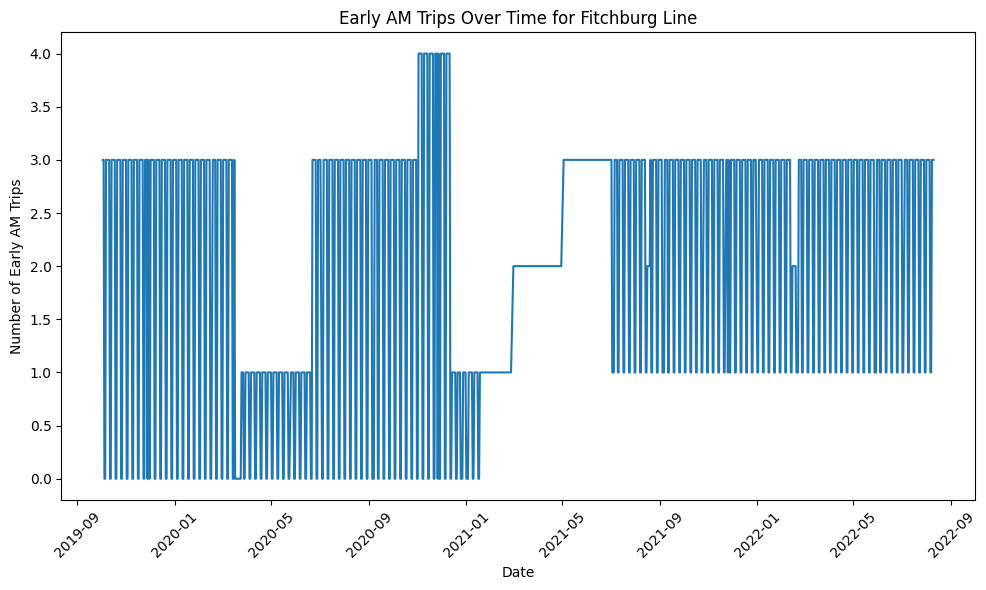

In [212]:
dfFitchburgCleaned['date'] = pd.to_datetime(dfFitchburgCleaned['date'])

dfFitchburgCleaned = dfFitchburgCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFitchburgCleaned['date'], dfFitchburgCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Fitchburg Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

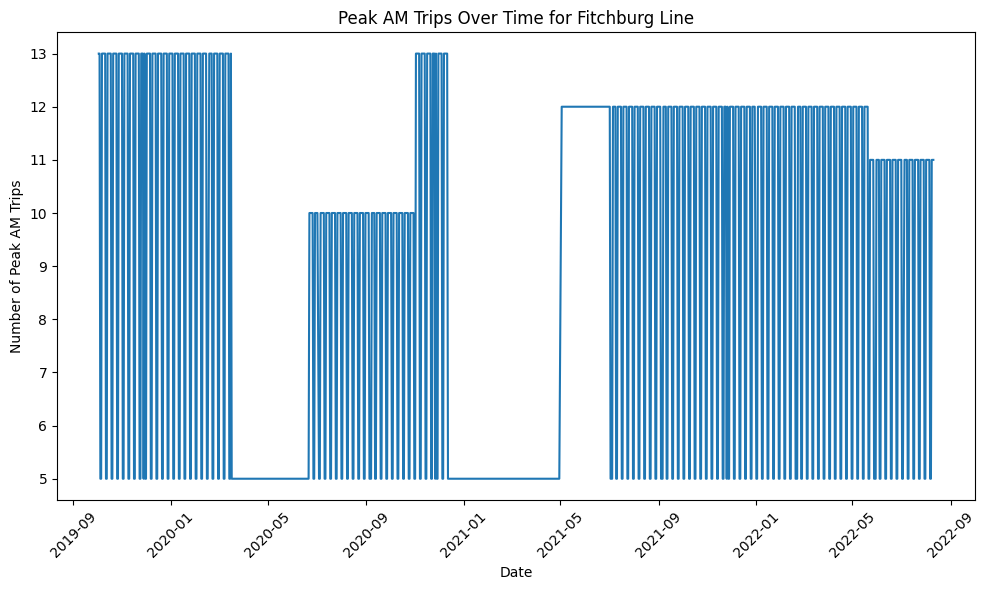

In [213]:
dfFitchburgCleaned['date'] = pd.to_datetime(dfFitchburgCleaned['date'])

dfFitchburgCleaned = dfFitchburgCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFitchburgCleaned['date'], dfFitchburgCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Fitchburg Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


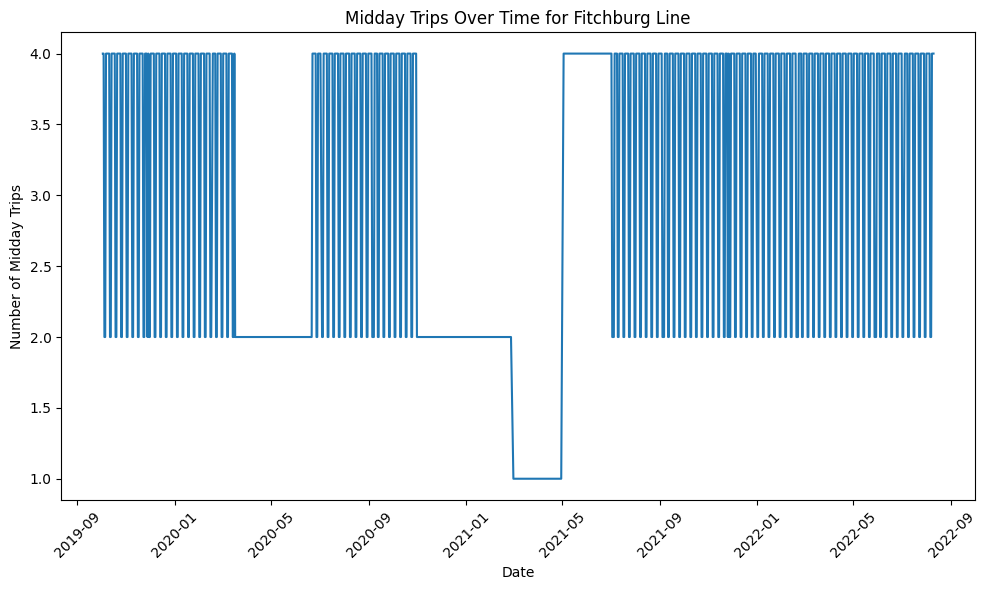

In [214]:
dfFitchburgCleaned['date'] = pd.to_datetime(dfFitchburgCleaned['date'])

dfFitchburgCleaned = dfFitchburgCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFitchburgCleaned['date'], dfFitchburgCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Fitchburg Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



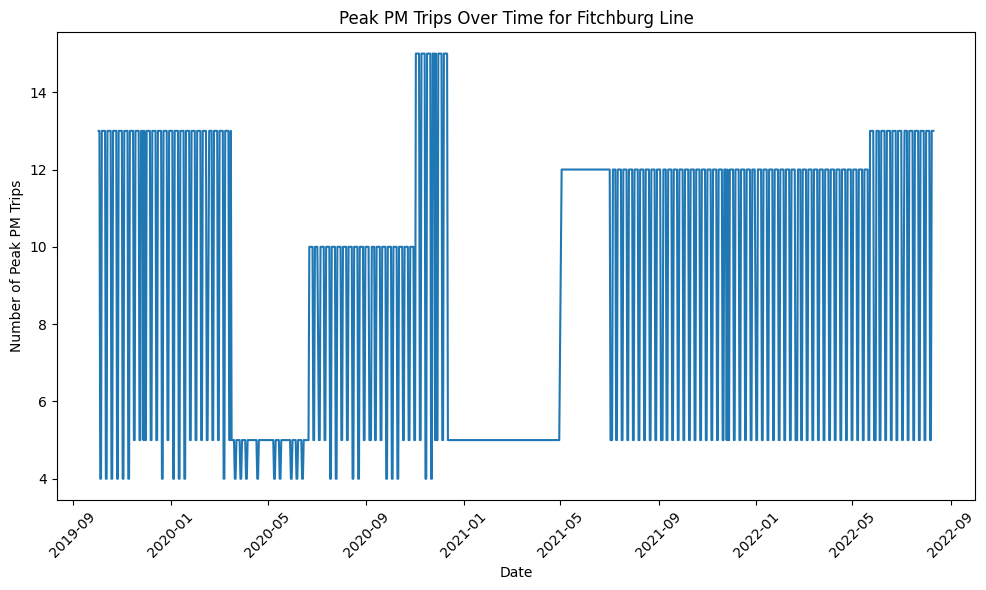

In [215]:
dfFitchburgCleaned['date'] = pd.to_datetime(dfFitchburgCleaned['date'])

dfFitchburgCleaned = dfFitchburgCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFitchburgCleaned['date'], dfFitchburgCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Fitchburg Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

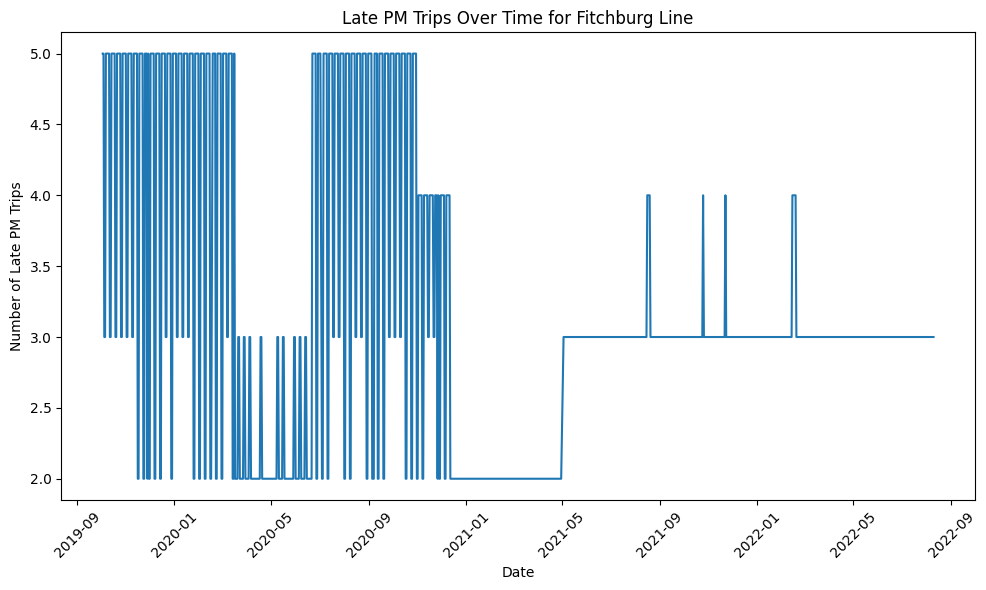

In [216]:
dfFitchburgCleaned['date'] = pd.to_datetime(dfFitchburgCleaned['date'])

dfFitchburgCleaned = dfFitchburgCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFitchburgCleaned['date'], dfFitchburgCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Fitchburg Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


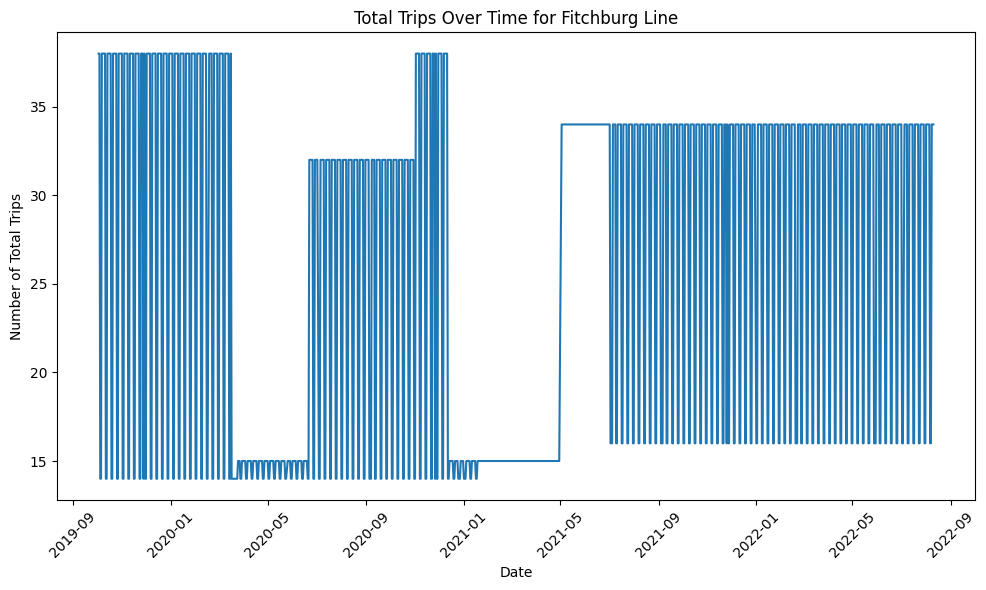

In [217]:
dfFitchburgCleaned['date'] = pd.to_datetime(dfFitchburgCleaned['date'])

dfFitchburgCleaned = dfFitchburgCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFitchburgCleaned['date'], dfFitchburgCleaned['Total'])
plt.title('Total Trips Over Time for Fitchburg Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [218]:
csv_file_path = 'updated_Fitchburg.csv'
dfFitchburgCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 13. Fairmount Line

In [219]:
dfFairmount = pd.read_csv("CR-Fairmount.csv")
dfFairmount.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station
0,2021-06-14,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station
1,2021-06-15,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station
2,2021-06-16,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station
3,2021-06-17,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station
4,2021-06-18,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station


In [220]:
dfFairmount['time'] = dfFairmount['time'].apply(adjust_and_convert_time)
dfFairmount['time'] = pd.to_datetime(dfFairmount['time'], format='%H:%M:%S').dt.time
dfFairmount['PartOfDay'] = dfFairmount['time'].apply(categorize_time_of_day)

dfFairmount.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-06-14,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station,Early_AM
1,2021-06-15,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station,Early_AM
2,2021-06-16,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station,Early_AM
3,2021-06-17,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station,Early_AM
4,2021-06-18,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station,Early_AM


In [221]:
grouped_df_Fairmount = dfFairmount.groupby('date')
grouped_df_Fairmount.head(5)

,date,time,trip_id,line_id,route_id,route_pattern_id,route_name,route_pattern_name,service_id,service_typicality,direction,from_station,to_station,PartOfDay
0,2021-06-14,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station,Early_AM
1,2021-06-15,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station,Early_AM
2,2021-06-16,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station,Early_AM
3,2021-06-17,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station,Early_AM
4,2021-06-18,04:45:00,CR-483249-900,line-Fairmount,CR-Fairmount,CR-Fairmount-3dfc2722-1,Fairmount Line,Readville - South Station via Fairmount,SPR21-S-Wdy-5,1,1,Readville,South Station,Early_AM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18246,2020-03-28,11:30:00,CR-Saturday-FranklinPTC-20-1760C0,line-Fairmount,CR-Fairmount,CR-Fairmount-0-1,Fairmount Line,Readville - South Station via Fairmount,CR-Sa-Fairmount-FranklinPTC-20C0,4,1,Readville,South Station,Peak_AM
18247,2020-04-04,11:30:00,CR-Saturday-FranklinPTC-20-1760C0,line-Fairmount,CR-Fairmount,CR-Fairmount-0-1,Fairmount Line,Readville - South Station via Fairmount,CR-Sa-Fairmount-FranklinPTC-20C0,4,1,Readville,South Station,Peak_AM
18248,2020-04-11,11:30:00,CR-Saturday-FranklinPTC-20-1760C0,line-Fairmount,CR-Fairmount,CR-Fairmount-0-1,Fairmount Line,Readville - South Station via Fairmount,CR-Sa-Fairmount-FranklinPTC-20C0,4,1,Readville,South Station,Peak_AM
18249,2020-04-18,11:30:00,CR-Saturday-FranklinPTC-20-1760C0,line-Fairmount,CR-Fairmount,CR-Fairmount-0bb6bced-1,Fairmount Line,Readville - South Station via Fairmount,CR-Sa-Fairmount-FranklinPTC-20C0,4,1,Readville,South Station,Peak_AM


In [222]:
partDay = dfFairmount.groupby(['date', 'PartOfDay']).size().unstack(fill_value=0)
partDay['Total'] = partDay.sum(axis=1)
route_id = dfFairmount.groupby('date')['route_id'].first()
dfFairmountCleaned = partDay.join(route_id)
line_id = dfFairmount.groupby('date')['line_id'].first()
dfFairmountCleaned = partDay.join(line_id)
dfFairmountCleaned.reset_index(inplace=True)
dfFairmountCleaned.head(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
0,2019-10-03,0,7,4,13,15,39,line-Fairmount
1,2019-10-04,0,7,4,13,15,39,line-Fairmount
2,2019-10-05,0,6,4,10,12,32,line-Fairmount
3,2019-10-06,0,6,4,10,12,32,line-Fairmount
4,2019-10-07,0,7,4,13,15,39,line-Fairmount


In [223]:
dfFairmountCleaned.tail(5)

,date,Early_AM,Late_PM,Mid_day,Peak_AM,Peak_PM,Total,line_id
1020,2022-08-06,0,5,3,8,8,24,line-Fairmount
1021,2022-08-07,0,5,3,8,8,24,line-Fairmount
1022,2022-08-08,3,8,4,16,16,47,line-Fairmount
1023,2022-08-09,3,8,4,16,16,47,line-Fairmount
1024,2022-08-10,3,8,4,16,16,47,line-Fairmount


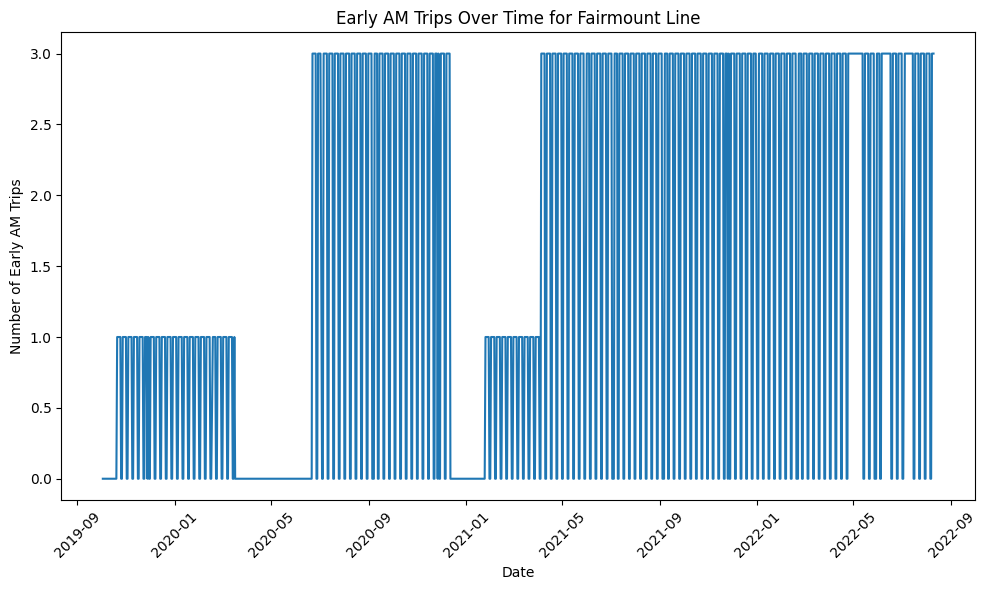

In [224]:
dfFairmountCleaned['date'] = pd.to_datetime(dfFairmountCleaned['date'])

dfFairmountCleaned = dfFairmountCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFairmountCleaned['date'], dfFairmountCleaned['Early_AM'])
plt.title('Early AM Trips Over Time for Fairmount Line')
plt.xlabel('Date')
plt.ylabel('Number of Early AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

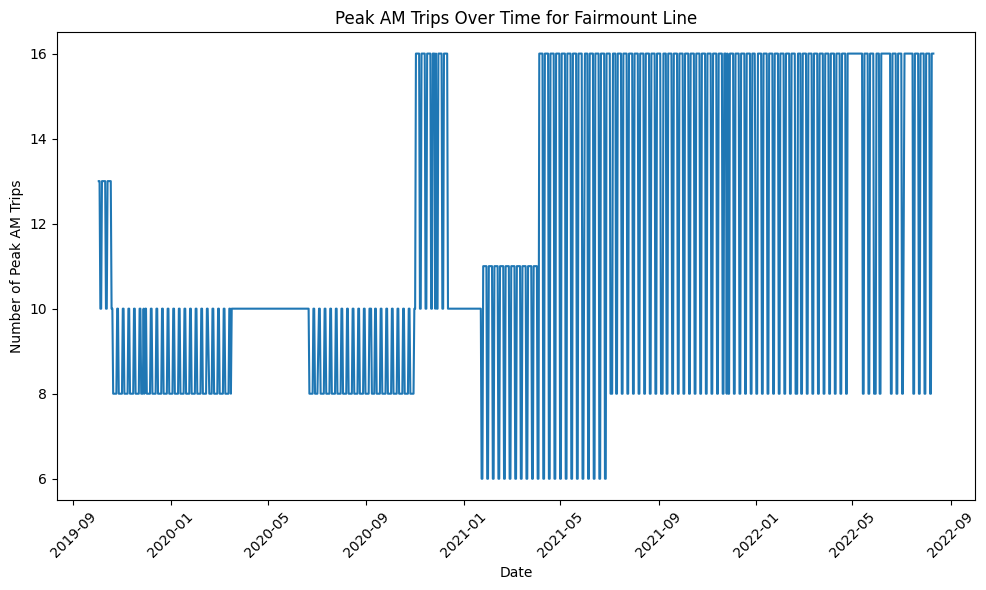

In [225]:
dfFairmountCleaned['date'] = pd.to_datetime(dfFairmountCleaned['date'])

dfFairmountCleaned = dfFairmountCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFairmountCleaned['date'], dfFairmountCleaned['Peak_AM'])
plt.title('Peak AM Trips Over Time for Fairmount Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak AM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


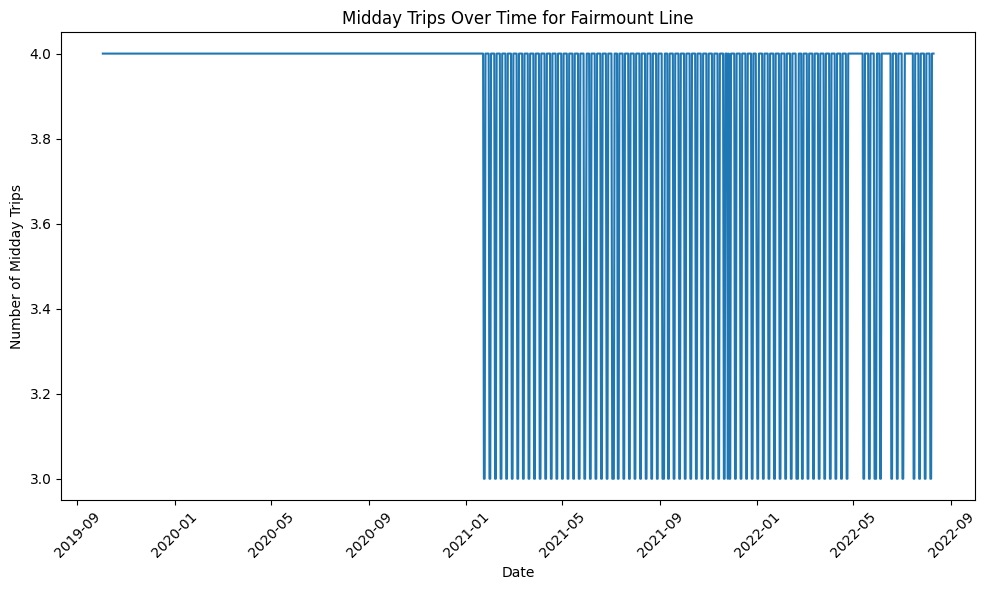

In [226]:
dfFairmountCleaned['date'] = pd.to_datetime(dfFairmountCleaned['date'])

dfFairmountCleaned = dfFairmountCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFairmountCleaned['date'], dfFairmountCleaned['Mid_day'])
plt.title('Midday Trips Over Time for Fairmount Line')
plt.xlabel('Date')
plt.ylabel('Number of Midday Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



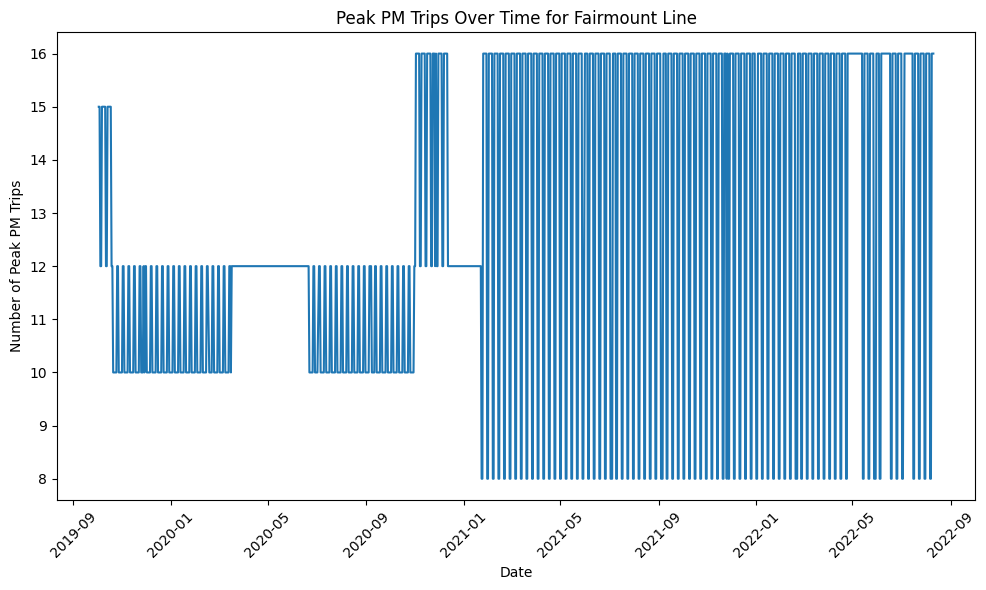

In [227]:
dfFairmountCleaned['date'] = pd.to_datetime(dfFairmountCleaned['date'])

dfFairmountCleaned = dfFairmountCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFairmountCleaned['date'], dfFairmountCleaned['Peak_PM'])
plt.title('Peak PM Trips Over Time for Fairmount Line')
plt.xlabel('Date')
plt.ylabel('Number of Peak PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

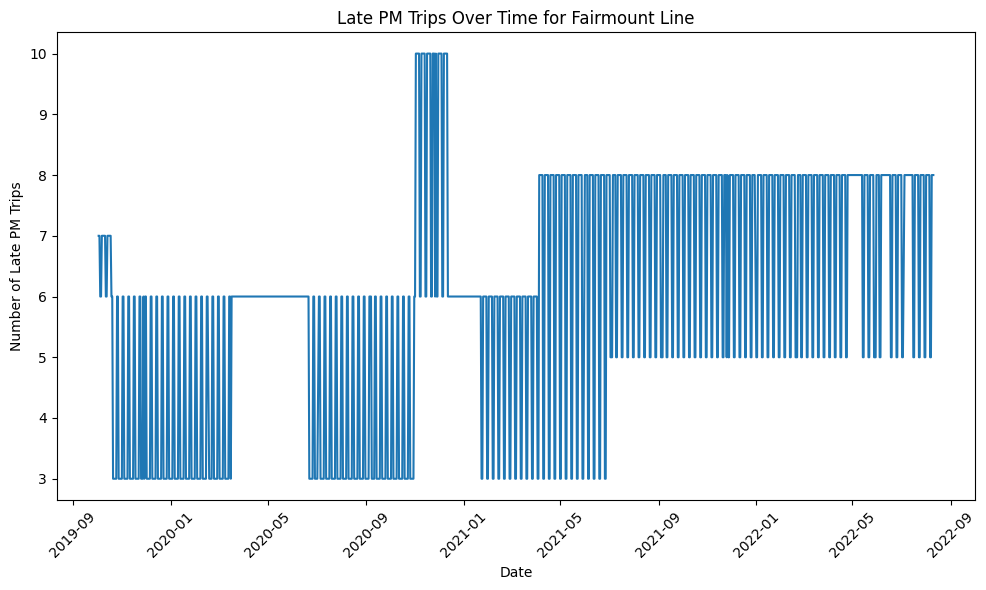

In [228]:
dfFairmountCleaned['date'] = pd.to_datetime(dfFairmountCleaned['date'])

dfFairmountCleaned = dfFairmountCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFairmountCleaned['date'], dfFairmountCleaned['Late_PM'])
plt.title('Late PM Trips Over Time for Fairmount Line')
plt.xlabel('Date')
plt.ylabel('Number of Late PM Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


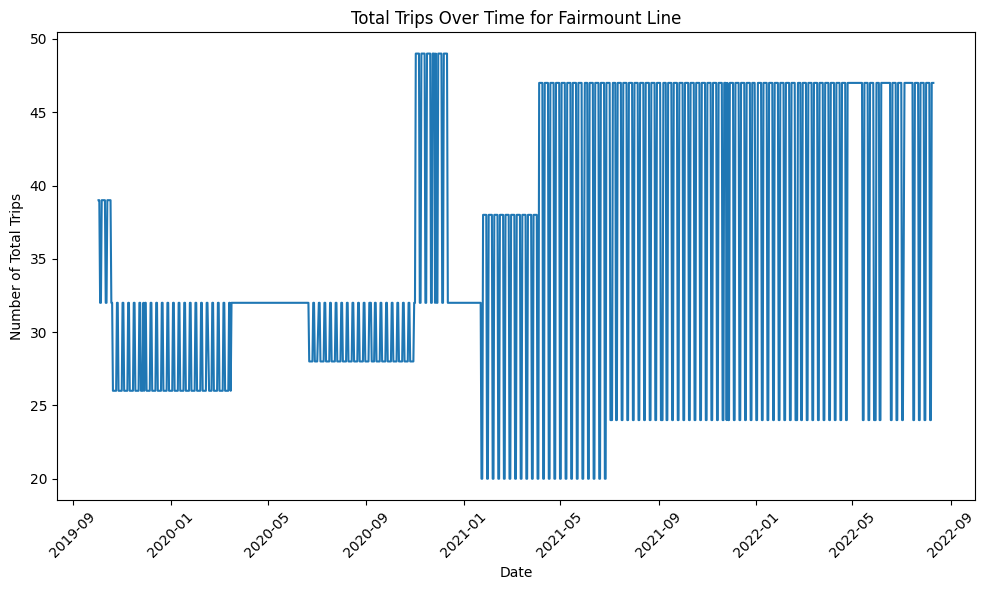

In [229]:
dfFairmountCleaned['date'] = pd.to_datetime(dfFairmountCleaned['date'])

dfFairmountCleaned = dfFairmountCleaned.sort_values(by='date')

plt.figure(figsize=(10, 6))
plt.plot(dfFairmountCleaned['date'], dfFairmountCleaned['Total'])
plt.title('Total Trips Over Time for Fairmount Line')
plt.xlabel('Date')
plt.ylabel('Number of Total Trips')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [230]:
csv_file_path = 'updated_Fairmount.csv'
dfFairmountCleaned.to_csv(csv_file_path, index=False)
files.download(csv_file_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>